# Bank MKT

**Abstract:** The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe a term deposit (variable y).

**Data Set Information:** The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed.

### Description variables:

##### Clients:
- age (numeric)
- job:typeofjob(categorical:'admin.','bluecollar','entrepreneur','housemaid','management','retired','selfemployed','services','student','technician', 'unemployed','unknown')
- marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
- education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
- default: has credit in default? (categorical: 'no','yes','unknown')
- housing: has housing loan? (categorical: 'no','yes','unknown')
- loan: has personal loan? (categorical: 'no','yes','unknown')

##### Related with the last contact of the current campaign:
- contact: contact communication type (categorical: 'cellular','telephone')
- month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
- day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
- duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

##### Other attributes:
- campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
- pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
- previous: number of contacts performed before this campaign and for this client (numeric)
- poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

##### Social and economic context attributes
- emp.var.rate: employment variation rate - quarterly indicator (numeric)
- cons.price.idx: consumer price index - monthly indicator (numeric)
- cons.conf.idx: consumer confidence index - monthly indicator (numeric)
- euribor3m: euribor 3 month rate - daily indicator (numeric)
- nr.employed: number of employees - quarterly indicator (numeric)

##### Output variable (desired target):
- y - has the client subscribed a term deposit? (binary: 'yes','no')

Al desconocer el dataset, se pueden hacer una gran cantidad de gráficos para comprender el tipo de datos con el que tratamos ya que poseemos 21 varibles que alimentarán nuestro modelo.

In [1]:
#Importamos Librerias
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas import Series
%matplotlib inline
import math
import plotnine
import scipy as sp

#Módulos específicos de cada modelo desde SKLearn:

#Para evaluar parámetros
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

#Label encoder 
from sklearn.preprocessing import LabelEncoder

#Árbol de desición 
from sklearn.tree import DecisionTreeClassifier # Arboles de decisión para regresión
from sklearn.tree import plot_tree # Función para visualizar el árbol
from sklearn import tree

#Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

#KNN
from pylab import rcParams
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn import preprocessing

#Regresión Logística
from sklearn.linear_model import LogisticRegression

#SVM
from sklearn import svm

#GaussianNB
from sklearn.naive_bayes import GaussianNB

#Módulos utiles para evaluar los modelos 
from sklearn.model_selection import train_test_split # Para separar en train y test
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report

#Optimización de hiperparámetros
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import model_selection
from pylab import rcParams
from collections import Counter

#Módulos de imblearn
import imblearn as im
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn import under_sampling as us
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier

#Ensamble
import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb

#Otros
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [2]:
# Leemos csv

df = pd.read_csv('bank.csv', sep=';')

In [3]:
# Mostramos los 100 primeros registros

df.head(100)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,45,services,married,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
96,42,management,married,university.degree,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
97,53,admin.,divorced,university.degree,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
98,37,technician,single,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
# Mostramos los 100 últimos registros

df.tail(100)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41088,18,student,single,basic.4y,no,yes,no,telephone,nov,tue,...,1,13,2,success,-1.1,94.767,-50.8,1.049,4963.6,yes
41089,50,blue-collar,divorced,professional.course,no,yes,no,telephone,nov,tue,...,2,7,2,success,-1.1,94.767,-50.8,1.049,4963.6,yes
41090,31,admin.,single,university.degree,no,no,yes,cellular,nov,wed,...,2,3,6,success,-1.1,94.767,-50.8,1.048,4963.6,no
41091,31,admin.,single,university.degree,no,yes,no,cellular,nov,wed,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.048,4963.6,no
41092,31,admin.,single,university.degree,no,yes,no,cellular,nov,wed,...,1,2,5,success,-1.1,94.767,-50.8,1.048,4963.6,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [5]:
print('Dimensión del dataset: {}'.format(df.shape))

#Esto nos indica que tenemos 41188 registros y 21 columnas

Dimensión del dataset: (41188, 21)


In [3]:
# busquemos las variables categóricas

print('Jobs:\n', df['job'].unique())
print('Marital:\n', df['marital'].unique())
print('Education:\n', df['education'].unique())

Jobs:
 ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
Marital:
 ['married' 'single' 'divorced' 'unknown']
Education:
 ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']


In [4]:
print('Default:\n', df['default'].unique())
print('Housing:\n', df['housing'].unique())
print('Loan:\n', df['loan'].unique())

Default:
 ['no' 'unknown' 'yes']
Housing:
 ['no' 'yes' 'unknown']
Loan:
 ['no' 'yes' 'unknown']


In [5]:
#Buscando outliers o nulls

print('Min age: ', df['age'].max())
print('Max age: ', df['age'].min())
print('Null Values: ', df['age'].isnull().any())

Min age:  98
Max age:  17
Null Values:  False


### Exploratory Data Analysis

Tipos de dato por columna

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

El describe de pandas nos devuelve valores como la tendencia central, dispersión y la forma de la distribución de un conjunto de datos, excluyendo los valores de NaN.

In [11]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


El ProfileReport nos hace un resumen extenso de diferentes aspectos del dataset:
- nos muestra correlaciones de diferentes tipos (Perason, Spermans, Kendall, etc)
- plotea gráficos correspondientes a cada columna
- nos muestra missing values por columna
- muestra head y tail del dataset
- muestra filas repetidas

En resumen, hace un *describe* mucho más extenso y completo.

In [12]:
from pandas_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'duration'}>,
        <AxesSubplot:title={'center':'campaign'}>],
       [<AxesSubplot:title={'center':'pdays'}>,
        <AxesSubplot:title={'center':'previous'}>,
        <AxesSubplot:title={'center':'emp.var.rate'}>],
       [<AxesSubplot:title={'center':'cons.price.idx'}>,
        <AxesSubplot:title={'center':'cons.conf.idx'}>,
        <AxesSubplot:title={'center':'euribor3m'}>],
       [<AxesSubplot:title={'center':'nr.employed'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

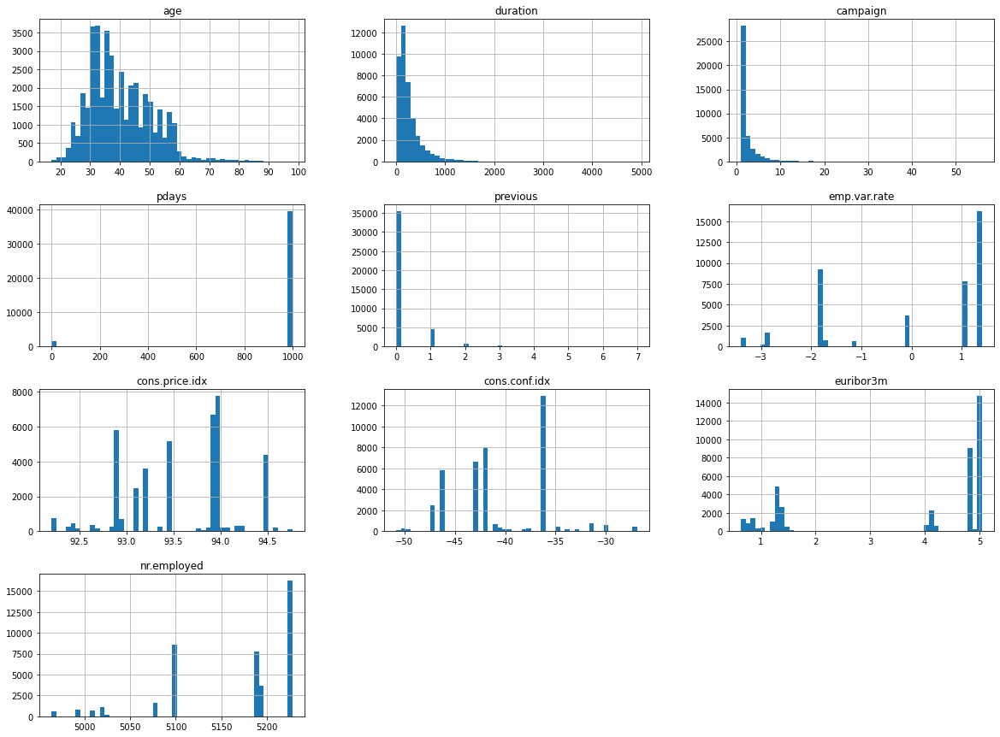

In [19]:
# Ploteamos histogramas para ver la dispersión que tienen los datos por columna

df.hist(bins = 50, figsize=(20,15))

#### Analizamos nulls

In [20]:
df.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [21]:
from funpymodeling.exploratory import status

status(df)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,age,0,0.0,0,0.000000,78,int64
1,job,0,0.0,0,0.000000,12,object
2,marital,0,0.0,0,0.000000,4,object
3,education,0,0.0,0,0.000000,8,object
4,default,0,0.0,0,0.000000,3,object
5,housing,0,0.0,0,0.000000,3,object
6,loan,0,0.0,0,0.000000,3,object
7,contact,0,0.0,0,0.000000,2,object
8,month,0,0.0,0,0.000000,10,object
9,day_of_week,0,0.0,0,0.000000,5,object


<AxesSubplot:>

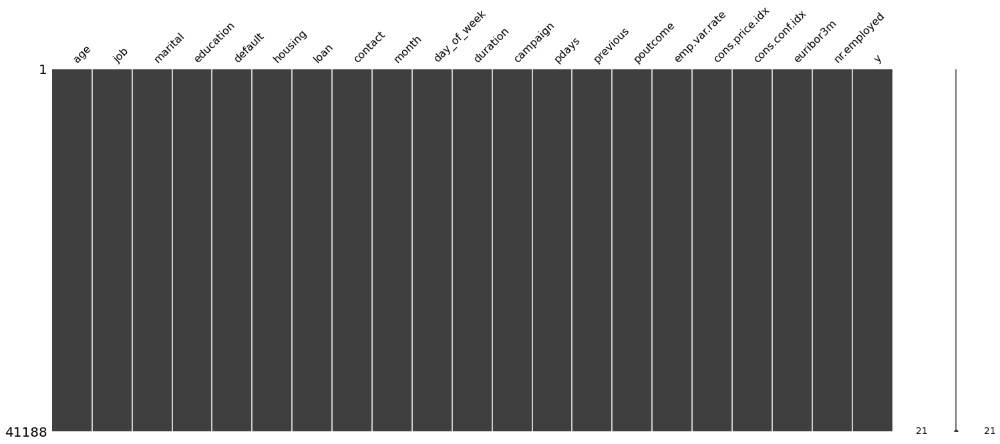

In [22]:
import missingno as msno

msno.matrix(df)

Este analisis, en síntesis, nos indica que no tenemos nulls en nuestro dataset

#### Analizamos correlaciones

Las correlaciones podemos verlas también en el ProfileReport pero también podemos plotearlas nuevamente para analizarlas.

In [26]:
corr = df.corr()

In [27]:
corr

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,-0.000866,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725
duration,-0.000866,1.000000,-0.071699,-0.047577,0.020640,-0.027968,0.005312,-0.008173,-0.032897,-0.044703
campaign,0.004594,-0.071699,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095
pdays,-0.034369,-0.047577,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605
previous,0.024365,0.020640,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333
emp.var.rate,-0.000371,-0.027968,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970
cons.price.idx,0.000857,0.005312,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034
cons.conf.idx,0.129372,-0.008173,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.010767,-0.032897,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154
nr.employed,-0.017725,-0.044703,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000


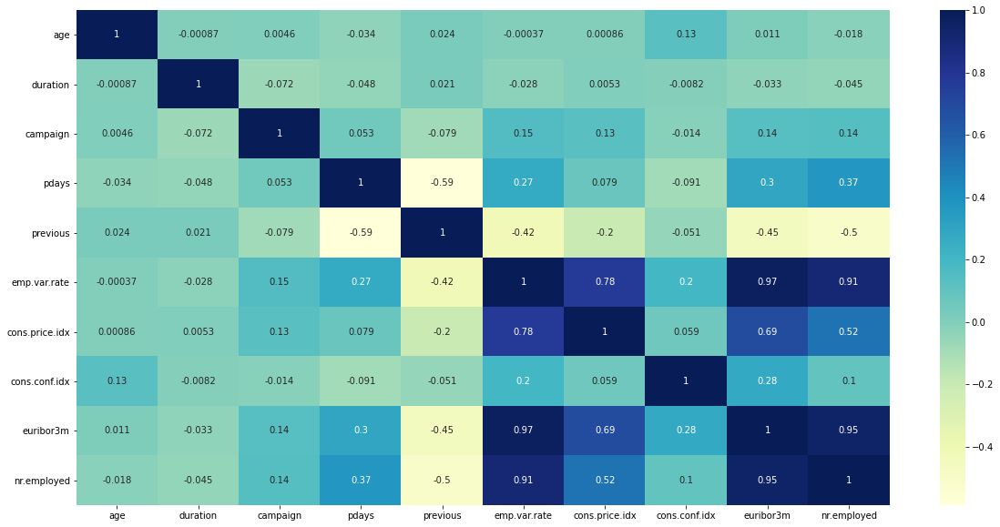

In [25]:
plt.figure(figsize=(20,10))
sns.heatmap(corr, annot=True, cmap='YlGnBu')
plt.savefig('corr.pdf')
plt.show()

#### Analizamos outliers

En esta instancia buscamos datos que estén por fuera de los rangos "normales". A los mismos los llamamos outliers y son valores atípicos, observaciones numéricamente distantes del resto de los datos.

El gráfico de caja (“box-plot”) es una forma de presentación estadística destinada a resaltar aspectos de la distribución de las observaciones en una o más series de datos cuantitativos.

**Social and economic context attributes:**

Text(0.5, 0, 'Number of employees - quarterly indicator')

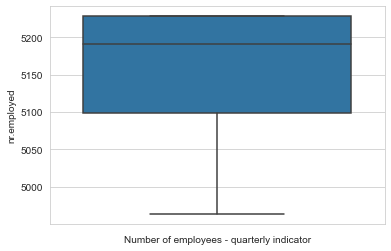

In [28]:
sns.set_style("whitegrid")

ax = sns.boxplot(data=df, y=df['nr.employed'])
ax.set_xlabel('Number of employees - quarterly indicator')

Text(0.5, 0, 'Consumer price index - monthly indicator')

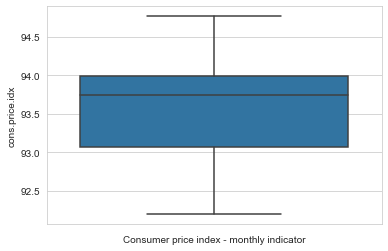

In [29]:
sns.set_style("whitegrid")

ax = sns.boxplot(data=df, y=df['cons.price.idx'])
ax.set_xlabel('Consumer price index - monthly indicator')

Text(0.5, 0, 'Employment variation rate - quarterly indicator')

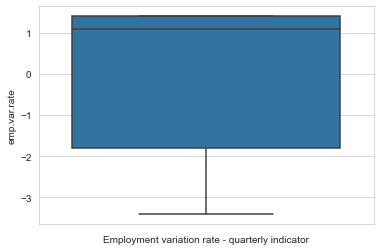

In [30]:
sns.set_style("whitegrid")

ax = sns.boxplot(data=df, y=df['emp.var.rate'])
ax.set_xlabel('Employment variation rate - quarterly indicator')

Text(0.5, 0, 'Consumer confidence index - monthly indicator ')

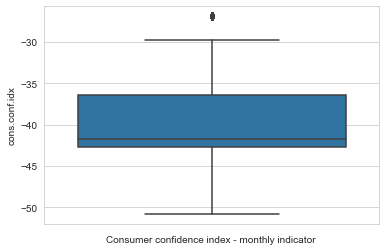

In [31]:
sns.set_style("whitegrid")

ax = sns.boxplot(data=df, y=df['cons.conf.idx'])
ax.set_xlabel('Consumer confidence index - monthly indicator ')

**Related with the last contact of the current campaign:**

Text(0.5, 0, 'Duration')

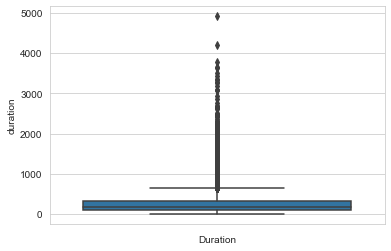

In [32]:
sns.set_style("whitegrid")

ax = sns.boxplot(data=df, y=df['duration'])
ax.set_xlabel('Duration')

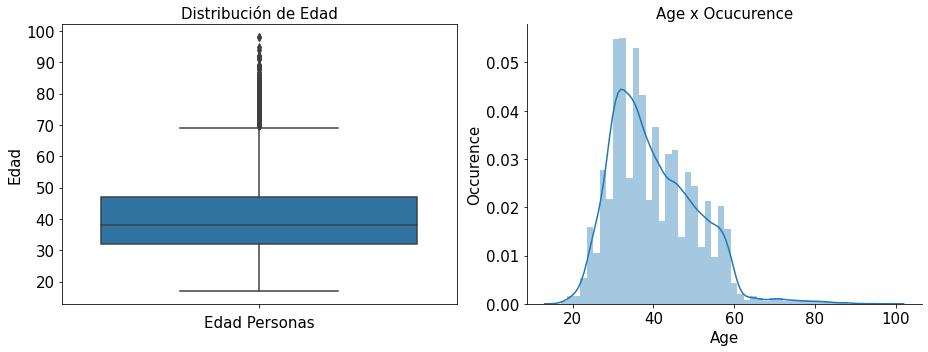

In [9]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 5))
sns.boxplot(x = 'age', data = bank_client, orient = 'v', ax = ax1)
ax1.set_xlabel('Edad Personas', fontsize=15)
ax1.set_ylabel('Edad', fontsize=15)
ax1.set_title('Distribución de Edad', fontsize=15)
ax1.tick_params(labelsize=15)

sns.distplot(bank_client['age'], ax = ax2)
sns.despine(ax = ax2)
ax2.set_xlabel('Age', fontsize=15)
ax2.set_ylabel('Occurence', fontsize=15)
ax2.set_title('Age x Ocucurence', fontsize=15)
ax2.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout() 

In [7]:
print('Numero de outliers: ', df[df['age'] > 69.6]['age'].count())
print('Numero de clientes: ', len(df))
#Outliers in %
print('Outliers son:', round(df[df['age'] > 69.6]['age'].count()*100/len(df),2), '%')

Numero de outliers:  469
Numero de clientes:  41188
Outliers son: 1.14 %


In [8]:
# Calculando algunos valores para evaluar esta variable independiente

print('MEAN:', round(df['age'].mean(), 1))

# Una desviación estándar baja indica que los puntos tienden a estar cerca del valor medio o esperado 
# Una desviación estándar alta indica que los puntos están dispersos

print('STD :', round(df['age'].std(), 1))

# la mejor manera de dar una idea precisa sobre la dispersión es utilizando el CV (coefficient variation) (STD/MEAN)*100
#    cv < 15%, low dispersion
#    cv > 30%, high dispersion

print('CV  :',round(df['age'].std()*100/df['age'].mean(), 1), ', Dispersión media alta')

MEAN: 40.0
STD : 10.4
CV  : 26.0 , Dispersión media alta


Conclusión sobre 'Edad', en mi opinión debido a la dispersión casi alta y con solo mirar este gráfico no podemos concluir si la edad tiene un efecto alto en nuestra variable y, necesitamos seguir buscando algún patrón. La dispersión media alta significa que tenemos personas de todas las edades y tal vez todas puedan suscribirse a un depósito a plazo, o no. 

Ploteamos varias variables numericas que nos indican que no hay practicamente outliers, es decir, no encontramos outliers más que en *'Consumer confidence index'*.

#### Visualizaciones 

Las visualizaciones nos permitirán entender como están distribuidos los datos y entender más la muestra que estamos analizando, mucho más en este caso que estamos trabajando con u dataset desconocido.

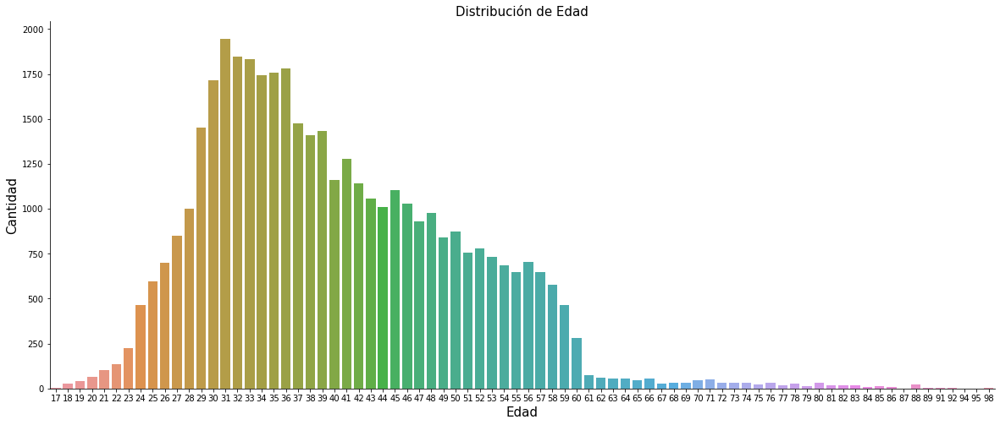

In [13]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
sns.countplot(x = 'age', data = df)
ax.set_xlabel('Edad', fontsize=15)
ax.set_ylabel('Cantidad', fontsize=15)
ax.set_title('Distribución de Edad', fontsize=15)
sns.despine()

La mayor cantidad de personas en el dataset están entre sos 30 y 40 años.

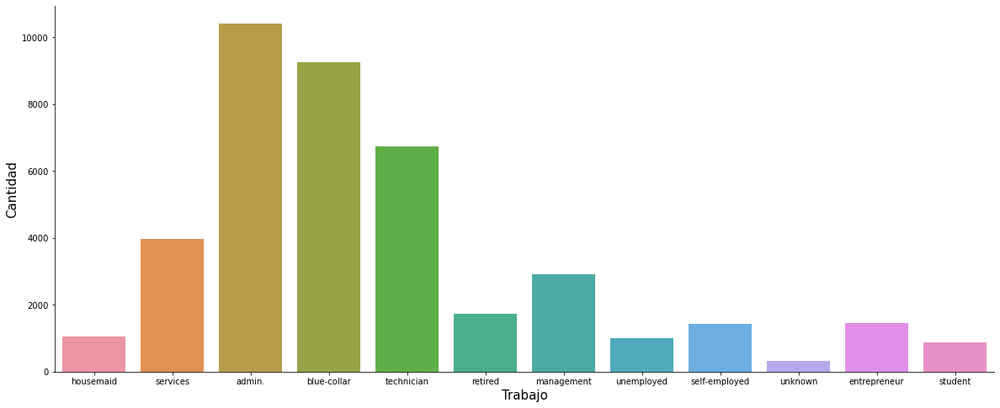

In [186]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
sns.countplot(x = 'job', data = df)
ax.set_xlabel('Trabajo', fontsize=15)
ax.set_ylabel('Cantidad', fontsize=15)
ax.set_title('Trabajo', fontsize=15)
ax.tick_params(labelsize=10)
sns.despine()

La mayoría de las personas de la muestra son *Estudiantes*  o estan *retirados*.

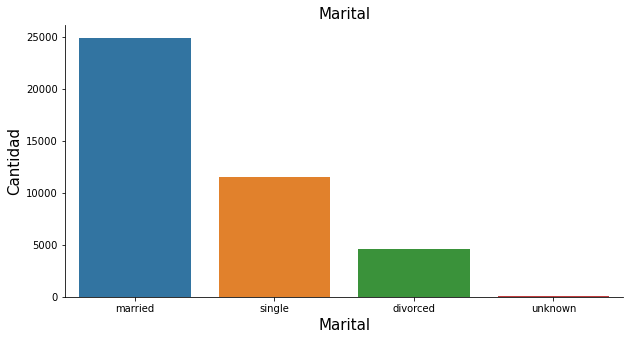

In [188]:
fig, ax = plt.subplots()
fig.set_size_inches(10, 5)
sns.countplot(x = 'marital', data = df)
ax.set_xlabel('Marital', fontsize=15)
ax.set_ylabel('Cantidad', fontsize=15)
ax.set_title('Marital', fontsize=15)
sns.despine()

Text(0.5, 1.0, 'Educación')

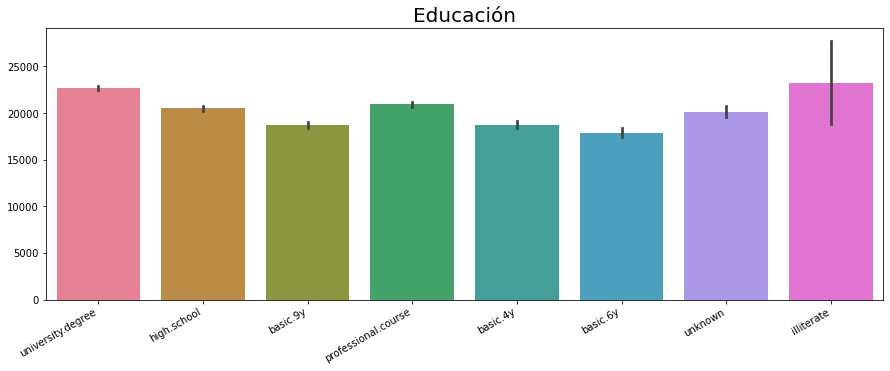

In [11]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 5)
sns.countplot(x = 'education', data = df)
ax.set_xlabel('Educación', fontsize=15)
ax.set_ylabel('Cantidad', fontsize=15)
ax.set_title('Educación', fontsize=15)
ax.tick_params(labelsize=15)
sns.despine()

La mayoría de las personas de la muestra son personas que *no recibieron educación* o estan *recibidos con títulos universitarios*.

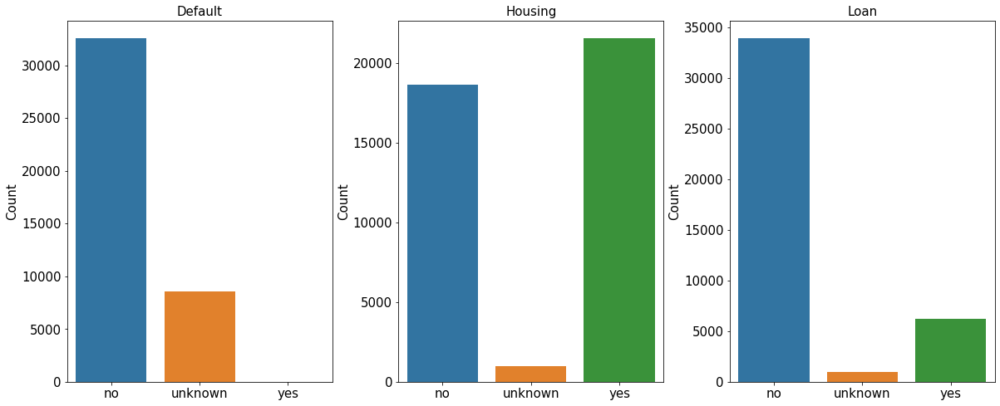

In [12]:
# Default, tiene un crédito ?
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (20,8))
sns.countplot(x = 'default', data = df, ax = ax1, order = ['no', 'unknown', 'yes'])
ax1.set_title('Default', fontsize=15)
ax1.set_xlabel('')
ax1.set_ylabel('Count', fontsize=15)
ax1.tick_params(labelsize=15)

# Housing, tiene uno ?
sns.countplot(x = 'housing', data = df, ax = ax2, order = ['no', 'unknown', 'yes'])
ax2.set_title('Housing', fontsize=15)
ax2.set_xlabel('')
ax2.set_ylabel('Count', fontsize=15)
ax2.tick_params(labelsize=15)

# Loan, tiene uno ?
sns.countplot(x = 'loan', data = df, ax = ax3, order = ['no', 'unknown', 'yes'])
ax3.set_title('Loan', fontsize=15)
ax3.set_xlabel('')
ax3.set_ylabel('Count', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.25)

In [9]:
print('Default:\n Ningún crédito en default:'     , df[df['default'] == 'no']     ['age'].count(),
              '\n Unknown crédito en default:', df[df['default'] == 'unknown']['age'].count(),
              '\n Tiene un crédito en default:' , df[df['default'] == 'yes']    ['age'].count())

Default:
 Ningún crédito en default: 32588 
 Unknown crédito en default: 8597 
 Tiene un crédito en default: 3


In [10]:
print('Housing:\n Ningún housing in loan:'     , df[df['housing'] == 'no']     ['age'].count(),
              '\n Unknown housing in loan:', df[df['housing'] == 'unknown']['age'].count(),
              '\n Tiene housing in loan:' , df[df['housing'] == 'yes']    ['age'].count())

Housing:
 Ningún housing in loan: 18622 
 Unknown housing in loan: 990 
 Tiene housing in loan: 21576


In [11]:
print('Housing:\n No tiene personal loan:'     , df[df['loan'] == 'no']     ['age'].count(),
              '\n Unknown  personal loan:', df[df['loan'] == 'unknown']['age'].count(),
              '\n Tiene personal loan:'    , df[df['loan'] == 'yes']    ['age'].count())

Housing:
 No tiene personal loan: 33950 
 Unknown  personal loan: 990 
 Tiene personal loan: 6248


Las edades no significan mucho, tienen una dispersión media y no tienen sentido relacionarse con otras variables no dirán ningún insight. Empleo, Matrimonial y Educación creo que el mejor análisis es solo el conteo de cada variable, si los relacionamos con las otras no es concluyente, todo este tipo de variables tiene sí, desconocida y no para préstamo, morosidad y vivienda. Incumplimiento, préstamo y vivienda, es solo para ver la distribución de las personas.

**Job:**

Text(0.5, 1.0, 'Prestamos de vivienda tomados en función del trabajo')

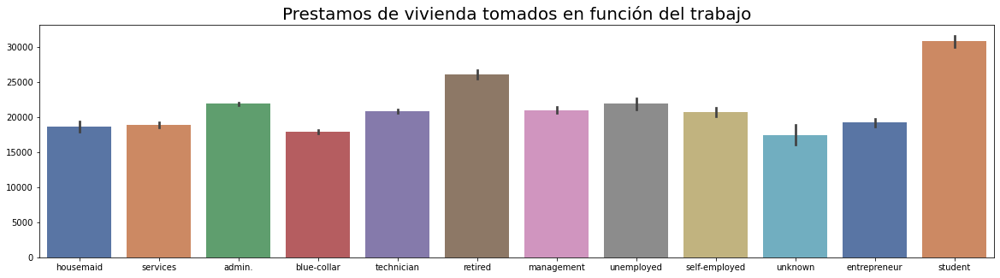

In [16]:
plt.figure(figsize=(20,5))
plot = sns.barplot(x=df['job'].values, y=df['housing'].index, palette="deep")
plot.set_xticklabels(plot.get_xticklabels())
plot.set_title("Prestamos de vivienda tomados en función del trabajo", fontsize=20)

Text(0.5, 1.0, 'Prestamos personales tomados en función del trabajo')

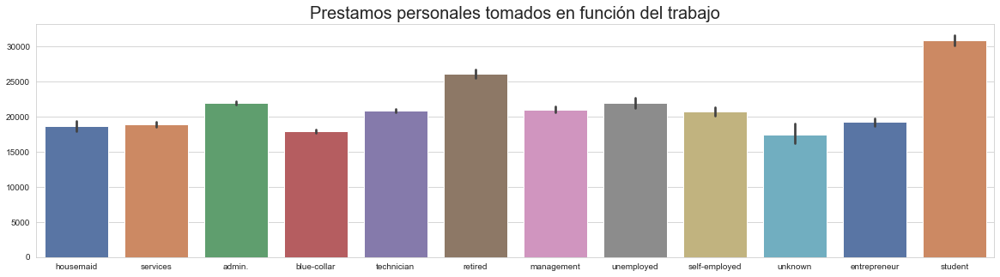

In [223]:
plt.figure(figsize=(20,5))
plot = sns.barplot(x=df['job'].values, y=df['loan'].index, palette="deep")
plot.set_xticklabels(plot.get_xticklabels())
plot.set_title("Prestamos personales tomados en función del trabajo", fontsize=20)

Text(0.5, 1.0, 'Crédito en mora en función de la edad')

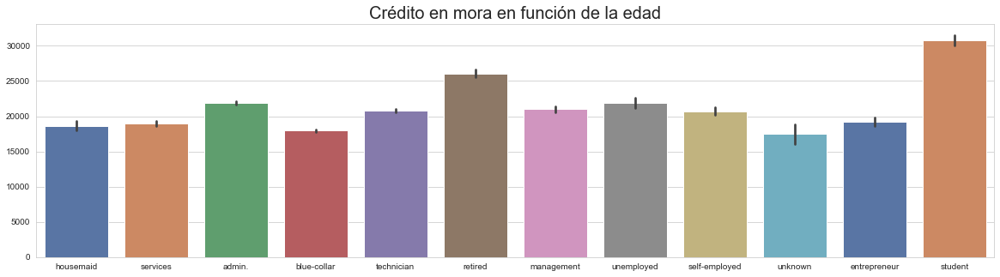

In [222]:
plt.figure(figsize=(20,5))
plot = sns.barplot(x=df['job'].values, y=df['default'].index, palette="deep")
plot.set_xticklabels(plot.get_xticklabels())
plot.set_title("Crédito en mora en función del trabajo", fontsize=20)

#### Análizamos la variable target: 'y'

In [17]:
print(pd.value_counts(df['y'], sort = True))

no     36548
yes     4640
Name: y, dtype: int64


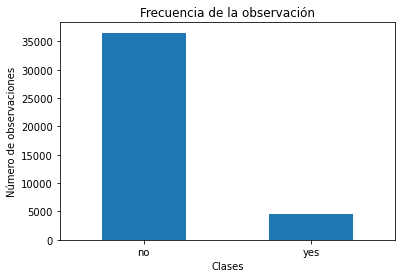

In [18]:
count_classes = pd.value_counts(df['y'], sort = True)
count_classes.plot(kind = 'bar', rot=0)
plt.title("Frecuencia de la observación")
plt.xlabel("Clases")
plt.ylabel("Número de observaciones");

Esto nos muestra que nuestros datos están desbalanceados, es decir, poseemos más de una clase que de otra: tenemos una clase minoritaria.Esto provoca un desbalanceo en los datos que utilizaremos para el entrenamiento del modelo. Esta situación, por lo general, afecta a los algoritmos en su proceso de generalización de la información y perjudicando a las clases minoritarias. Esto lo debemos tratar de algún modo de cara al deployamiento de nuestros modelos.

#### Tratamiento variables categóricas

In [12]:
# Label encoder order is alphabetical
from sklearn.preprocessing import LabelEncoder
labelencoder_X = LabelEncoder()
df['job']      = labelencoder_X.fit_transform(df['job']) 
df['marital']  = labelencoder_X.fit_transform(df['marital']) 
df['education']= labelencoder_X.fit_transform(df['education']) 
df['default']  = labelencoder_X.fit_transform(df['default']) 
df['housing']  = labelencoder_X.fit_transform(df['housing']) 
df['loan']     = labelencoder_X.fit_transform(df['loan']) 

In [13]:
#function to creat group of ages, this helps because we have 78 differente values here
def age(df):
    df.loc[df['age'] <= 32, 'age'] = 1
    df.loc[(df['age'] > 32) & (df['age'] <= 47), 'age'] = 2
    df.loc[(df['age'] > 47) & (df['age'] <= 70), 'age'] = 3
    df.loc[(df['age'] > 70) & (df['age'] <= 98), 'age'] = 4
           
    return df

age(df);

In [14]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,3,3,1,0,0,0,0,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,3,7,1,3,1,0,0,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,2,7,1,3,0,2,0,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,2,0,1,1,0,0,0,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,3,7,1,3,0,0,2,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [21]:
print(df.shape)
df.head()

(41188, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,1,3,1,0,0,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,1,7,1,3,1,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,1,7,1,3,0,2,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,1,0,1,1,0,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,1,7,1,3,0,0,2,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


**En relación al último contacto en base a la campaña actual**

In [16]:
df['contact'].isnull().any()

False

In [17]:
print("Kind of Contact: \n", df['contact'].unique())
print("\nWhich monthis this campaing work: \n", df['month'].unique())
print("\nWhich days of week this campaing work: \n", df['day_of_week'].unique())

Kind of Contact: 
 ['telephone' 'cellular']

Which monthis this campaing work: 
 ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']

Which days of week this campaing work: 
 ['mon' 'tue' 'wed' 'thu' 'fri']


**Duration**

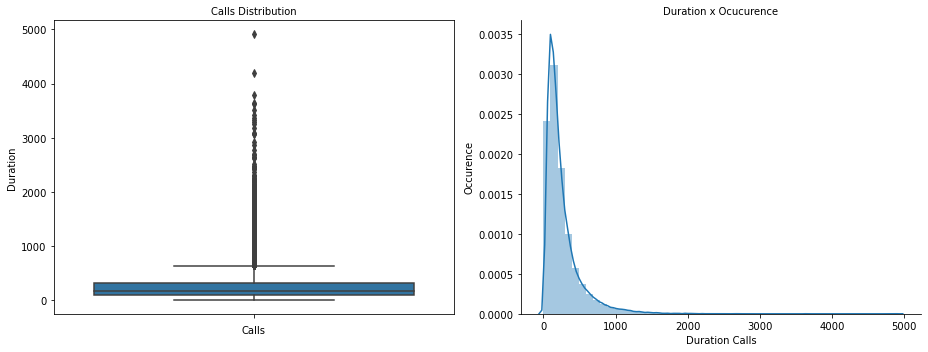

In [18]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 5))
sns.boxplot(x = 'duration', data = df, orient = 'v', ax = ax1)
ax1.set_xlabel('Calls', fontsize=10)
ax1.set_ylabel('Duration', fontsize=10)
ax1.set_title('Calls Distribution', fontsize=10)
ax1.tick_params(labelsize=10)

sns.distplot(df['duration'], ax = ax2)
sns.despine(ax = ax2)
ax2.set_xlabel('Duration Calls', fontsize=10)
ax2.set_ylabel('Occurence', fontsize=10)
ax2.set_title('Duration x Ocucurence', fontsize=10)
ax2.tick_params(labelsize=10)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout() 

##### PLease note: duration is different from age, Age has 78  values and Duration has 1544 different values

In [19]:
print("Max duration  call in minutes:  ", round((df['duration'].max()/60),1))
print("Min duration  call in minutes:   ", round((df['duration'].min()/60),1))
print("Mean duration call in minutes:   ", round((df['duration'].mean()/60),1))
print("STD duration  call in minutes:   ", round((df['duration'].std()/60),1))


Max duration  call in minutes:   82.0
Min duration  call in minutes:    0.0
Mean duration call in minutes:    4.3
STD duration  call in minutes:    4.3


In [21]:
# Quartiles
print('1º Quartile: ', df['duration'].quantile(q = 0.25))
print('2º Quartile: ', df['duration'].quantile(q = 0.50))
print('3º Quartile: ', df['duration'].quantile(q = 0.75))
print('4º Quartile: ', df['duration'].quantile(q = 1.00))

#Calcular los outliers:
  # Interquartile range, IQR = Q3 - Q1
  # lower 1.5*IQR whisker = Q1 - 1.5 * IQR 
  # Upper 1.5*IQR whisker = Q3 + 1.5 * IQR
    
print('Duration calls above: ', df['duration'].quantile(q = 0.75) + 
                      1.5*(df['duration'].quantile(q = 0.75) - df['duration'].quantile(q = 0.25)), 'are outliers')

1º Quartile:  102.0
2º Quartile:  180.0
3º Quartile:  319.0
4º Quartile:  4918.0
Duration calls above:  644.5 are outliers


In [4]:
print('Numero de outliers: ', df[df['duration'] > 644.5]['duration'].count())
print('Numero de clientes: ', len(df))

#Outliers in %
print('Outliers son el:', round(df[df['duration'] > 644.5]['duration'].count()*100/len(df),2), '%')

Numero de outliers:  2963
Numero de clientes:  41188
Outliers son el: 7.19 %


In [3]:
# Si la duración de la llamada es 0, entonces es obvio que la perona no se suscribió 

df[(df['duration'] == 0)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
6251,39,admin.,married,high.school,no,yes,no,telephone,may,tue,...,4,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
23031,59,management,married,university.degree,no,yes,no,cellular,aug,tue,...,10,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
28063,53,blue-collar,divorced,high.school,no,yes,no,cellular,apr,fri,...,3,999,0,nonexistent,-1.8,93.075,-47.1,1.479,5099.1,no
33015,31,blue-collar,married,basic.9y,no,no,no,cellular,may,mon,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.299,5099.1,no


**Contact, Month, Day of Week treatment**

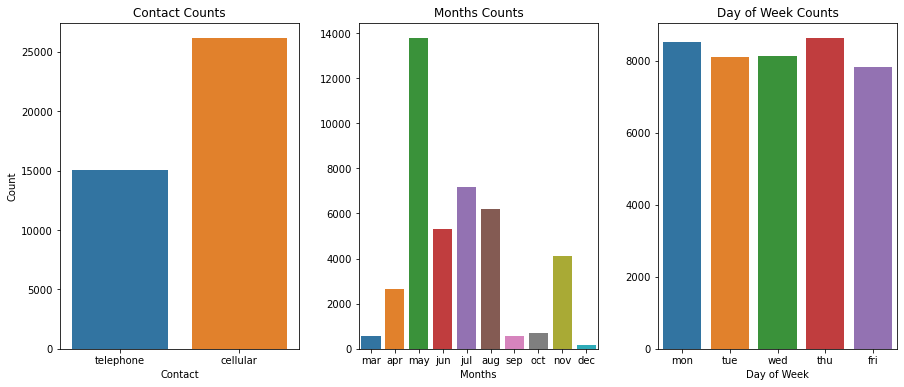

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (15,6))
sns.countplot(df['contact'], ax = ax1)
ax1.set_xlabel('Contact', fontsize = 10)
ax1.set_ylabel('Count', fontsize = 10)
ax1.set_title('Contact Counts')
ax1.tick_params(labelsize=10)

sns.countplot(df['month'], ax = ax2, order = ['mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'])
ax2.set_xlabel('Months', fontsize = 10)
ax2.set_ylabel('')
ax2.set_title('Months Counts')
ax2.tick_params(labelsize=10)

sns.countplot(df['day_of_week'], ax = ax3)
ax3.set_xlabel('Day of Week', fontsize = 10)
ax3.set_ylabel('')
ax3.set_title('Day of Week Counts')
ax3.tick_params(labelsize=10)

plt.subplots_adjust(wspace=0.25)

In [5]:
print('Edades por encima de: ', df['duration'].quantile(q = 0.75) + 
                              1.5*(df['duration'].quantile(q = 0.75) - df['duration'].quantile(q = 0.25)), 'are outliers')

Edades por encima de:  644.5 are outliers


In [32]:
df[df['duration'] > 640].count()

age               3008
job               3008
marital           3008
education         3008
default           3008
housing           3008
loan              3008
contact           3008
month             3008
day_of_week       3008
duration          3008
campaign          3008
pdays             3008
previous          3008
poutcome          3008
emp.var.rate      3008
cons.price.idx    3008
cons.conf.idx     3008
euribor3m         3008
nr.employed       3008
y                 3008
dtype: int64

**Trataimento:**

In [33]:
labelencoder_X = LabelEncoder()

df['contact'] = labelencoder_X.fit_transform(df['contact']) 
df['month'] = labelencoder_X.fit_transform(df['month']) 
df['day_of_week'] = labelencoder_X.fit_transform(df['day_of_week']) 

In [34]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,3,3,1,0,0,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,3,7,1,3,1,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,2,7,1,3,0,2,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,2,0,1,1,0,0,0,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,3,7,1,3,0,0,2,1,6,1,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [35]:
def duration(df):

    df.loc[df['duration'] <= 102, 'duration'] = 1
    df.loc[(df['duration'] > 102) & (df['duration'] <= 180)  , 'duration']    = 2
    df.loc[(df['duration'] > 180) & (df['duration'] <= 319)  , 'duration']   = 3
    df.loc[(df['duration'] > 319) & (df['duration'] <= 644.5), 'duration'] = 4
    df.loc[df['duration']  > 644.5, 'duration'] = 5

    return df
duration(df);

### Modelos Machine Learning

#### 1. Decision Tree

##### A. Decision Tree 

Los árboles de decisión son modelos predictivos formados por reglas binarias (si/no) con las que se consigue repartir las observaciones en función de sus atributos y predecir así el valor de la variable respuesta.

Aquí creamos efectivamente el árbol de clasificación. Vamos a empezar creando un árbol con una profundidad igual a 40 y luego vamos a jugar con los diferentes parámetros. Como todos los modelos en *scikit-learn* hay una línea que hace referencia a la construcción del modelo, otra al entrenamiento, y luego podemos predecir o ver el rendimiento del modelo.

**Creamos y entrenamos el modelo**

In [45]:
labels, counts = np.unique(df['y'], return_counts=True) # Función que devuelve las etiquetas y las frecuencias

print('Labels {}'.format(labels))
print('Frequencies {}'.format(counts))

Labels ['no' 'yes']
Frequencies [36548  4640]


In [60]:
random_seed = 7

features = [ 'contact', 'month', 'day_of_week', 'duration','cons.conf.idx', 'euribor3m', 'nr.employed', 'pdays']

# Variable a predecir
target = 'y'

# Construcción de la matríz de features
X = df[features].to_numpy()

# Construcción del vector a predecir
y = df[target].to_numpy()

# Creacion de las matrices de entrenamiento y testeo. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=random_seed) # el 0.20 hace referencia a la porción que se toma para testear; es decir, entrenamos con un 80% del dataset y lo testeamos con un 20%
print('Dimensión de la matriz de features para entrenamiento: {}'.format(X_train.shape))
print('Dimensión de la matriz de features para testeo: {}'.format(X_test.shape))

Dimensión de la matriz de features para entrenamiento: (32950, 8)
Dimensión de la matriz de features para testeo: (8238, 8)


**Creamos y entrenamos el modelo**

In [61]:
# Entrenamos el modelo
arbol = DecisionTreeClassifier(max_leaf_nodes = 40, max_depth = 4,) #40 es el nro de hojas que desprende el arbol; podemos cambiarlo
arbol.fit(X_train, y_train)
y_pred_train = arbol.predict(X_train)

# Score del modelo en el conjunto de entrenamiento 
score_in_train = arbol.score(X_train, y_train)

# Score del modelo en el conjunto de testeo
score_in_test = arbol.score(X_test, y_test)

print('Score en el set de entrenamiento: {}'.format(score_in_train))
print('Score en el set de testeo: {}'.format(score_in_test))

Score en el set de entrenamiento: 0.9097723823975721
Score en el set de testeo: 0.9110220927409566


**Classification Report:**

In [62]:
target_names = ['yes', 'no']
class_report = print(classification_report(y_pred_train, y_train, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.96      0.94      0.95     29950
          no       0.50      0.63      0.56      3000

    accuracy                           0.91     32950
   macro avg       0.73      0.78      0.75     32950
weighted avg       0.92      0.91      0.91     32950



**Visualización del árbol**

Aquí vamos a visualizar el árbol.

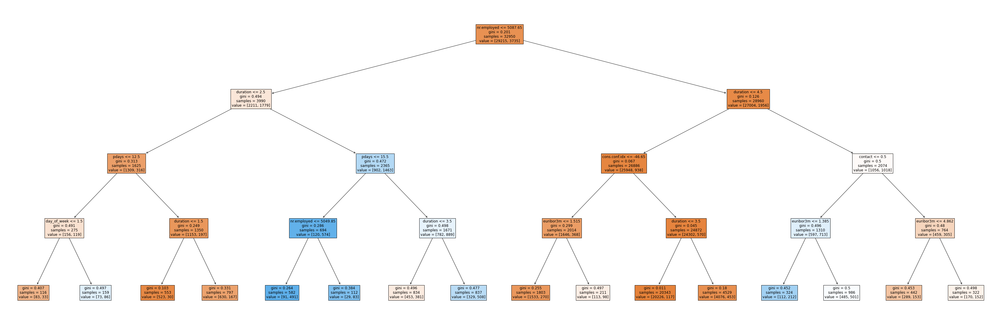

In [63]:
# Creamos la figura donde plotear el arbol de decisión con Matplotlib
fig, ax = plt.subplots(figsize = (60, 20))

# Llamamos a la función "plot_tree" que importamos de sklearn.tree arriba. 
# Pasamos el modelo que creamos y el nombre de las características como argumento. 
# y le decimos que trace el árbol en la figura que creamos
plot_tree(arbol, feature_names=features, fontsize = 12, filled = True, ax = ax)

 # Lo guardamos y lo vemos mejor en un png porque en la notebook es más complicado
plt.savefig("tree.png")     

**Partes del árbol:**
- El índice de Gini es la función de coste más utilizada en los árboles de decisión. Este índice calcula la cantidad de probabilidad de que una característica específica se clasifique incorrectamente cuando se selecciona al azar. El mismo es una métrica que cuantifica la pureza del nodo / hoja (más sobre hojas en un momento).Una puntuación de gini mayor que cero implica que las muestras contenidas dentro de ese nodo pertenecen a clases diferentes. Una puntuación de cero significa que el nodo es puro, que dentro de ese nodo solo existe una única clase de muestras. Aquí mayormente tenemos una puntuación de gini mayor que cero; por lo tanto, sabemos que las muestras contenidas en el nodo raíz pertenecen a clases diferentes.
- samples son las muestras tenidas en cuenta en cada caso
- el value dice cuántas muestras en el nodo dado caen en cada categoría.

**¿Cómo interpretamos este gráfico?** 

- El árbol se lee de arriba a abajo. 
- Cada nodo representa una pregunta que se responde con **verdadero** y **falso**: si es cierto, tomamos la rama de la izquierda; si es falso, el de la derecha. 
- La pregunta está marcada por la primera línea de cada bloque.
- El modelo performó de manera excelente, más allá que es un modelo simple, suele tener buenos resultados en problemas de clasificación.

Para determinar qué característica usar para realizar la primera división, es decir, para crear el nodo raíz, el algoritmo elige una característica y realiza una división. A continuación, analiza los subconjuntos y mide su impureza utilizando la puntuación de gini. Hace esto para múltiples umbrales y determina que la mejor división para la característica dada es la que produce los subconjuntos más puros. Esto se repite para todas las funciones del conjunto de entrenamiento. En última instancia, el nodo raíz está determinado por la característica que produce una división con subconjuntos más puros. Una vez que se decide el nodo raíz, el árbol crece a una profundidad de uno. El mismo proceso se repite para los otros nodos del árbol.

**Visualización de la matriz de confusión**

Aquí vamos a visualizar la matriz de confusión que es un diseño que permite la visualización del desempeño de un algoritmo, típicamente uno de aprendizaje supervisado. Cada fila de la matriz representa las instancias en una clase real, mientras que cada columna representa las instancias en una clase predicha, o viceversa.

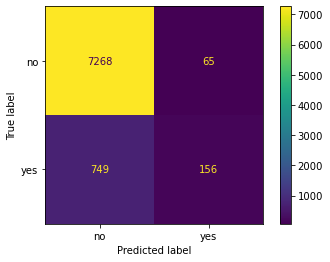

In [50]:
plot_confusion_matrix(arbol, X_test, y_test)  
plt.show()

In [64]:
# Importancia de cada feature
feature_importance = arbol.feature_importances_ 

print('Features: {}'.format(features))
print('Importance = {}'.format(feature_importance))

Features: ['contact', 'month', 'day_of_week', 'duration', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'pdays']
Importance = [0.00795057 0.         0.00345221 0.48839178 0.03725316 0.02104121
 0.39376955 0.04814153]


In [65]:
importances = arbol.feature_importances_
columns = features

Text(0.5, 1.0, 'Importancia Features')

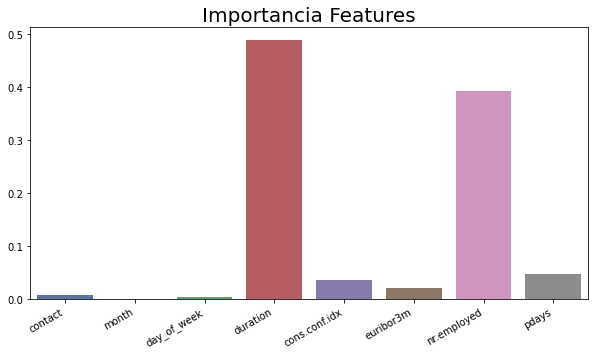

In [66]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=columns, y=importances, palette="deep")
plot.set_xticklabels(plot.get_xticklabels(), rotation=30, horizontalalignment='right')
plot.set_title("Importancia Features", fontsize=20)

##### K-Fold Cross Validation

In [150]:
scores = cross_val_score(arbol, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.89805825,
       0.88737864, 0.86262136, 0.84417476, 0.83341428, 0.85915493,
       0.88149587, 0.87761049, 0.90675085, 0.87663915, 0.79990287,
       0.79893152, 0.90820787, 0.79116076, 0.65274405, 0.15687227])

In [151]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.82 f1_score with a standard deviation of 0.16


##### B. Grid Search CV

Grid Search se utiliza para encontrar los hiperparámetros óptimos de un modelo que dan como resultado las predicciones más "precisas".

Vamos a optimizar el Tree Decision con un grid search en 4 pasos:

1. Generamos un diccionario con los hiperparámetros a optimizar
2. Intanciamos el grid search con el modelo elegido, los parámetros elegidos, la métrica de validación, la cantidad de folds para el cross validations y la cantidad de nucleos a usar
3. Entrenamos el grid search instanciado
4. Vemos los resultados

In [82]:
# 1 Creamos el un diccionario con los parámetros
parametros = {
                    'criterion': ['gini','entropy'],
                    'splitter': ['best', 'random'],
                    'max_depth':[2,4,6,8,10,20,30],
                    'max_leaf_nodes': [10,15,20,25,30,35,40,45,50]
             }

In [83]:
# 2 Instanciamos el grid search

grid_td = GridSearchCV(DecisionTreeClassifier(), parametros, cv=5, scoring='f1', n_jobs = -1, verbose = 2)

In [84]:
# 3 Entrenamos
grid_td.fit(X_train, y_train)

Fitting 5 folds for each of 252 candidates, totalling 1260 fits


C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 20, 30],
                         'max_leaf_nodes': [10, 15, 20, 25, 30, 35, 40, 45, 50],
                         'splitter': ['best', 'random']},
             scoring='f1', verbose=2)

In [85]:
# 4 Vemos los resultados del grid search
resultados = pd.DataFrame(grid_td.cv_results_).sort_values("rank_test_score")

resultados.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_splitter,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.060292,0.002606,0.048663,0.003784,gini,2,10,best,"{'criterion': 'gini', 'max_depth': 2, 'max_lea...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
160,0.114707,0.011590,0.072652,0.013931,entropy,4,50,best,"{'criterion': 'entropy', 'max_depth': 4, 'max_...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
161,0.095721,0.009985,0.066224,0.008179,entropy,4,50,random,"{'criterion': 'entropy', 'max_depth': 4, 'max_...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


In [90]:
print(grid_td.best_params_)
grid_predictions = grid_td.predict(X_test) 

{'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 10, 'splitter': 'best'}


In [92]:
# print classification report 
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

          no       0.90      0.99      0.95      7310
         yes       0.72      0.16      0.27       928

    accuracy                           0.90      8238
   macro avg       0.81      0.58      0.61      8238
weighted avg       0.88      0.90      0.87      8238



##### C. Random Search

In [342]:
# Grilla para Random Search
param_dist = {'criterion': ['gini','entropy'],
              'splitter': ['best', 'random'],
              'max_depth':[2,4,6,8,10,20,30],
              'max_leaf_nodes': [10,15,20,25,30,35,40,45,50]}

#Aplicamos la grilla al modelo
model = RandomizedSearchCV(arbol, param_dist,n_iter=100, random_state=0, cv=5)

In [343]:
#Entrenamos KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=DecisionTreeClassifier(max_depth=2,
                                                    max_leaf_nodes=10),
                   n_iter=100,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 4, 6, 8, 10, 20, 30],
                                        'max_leaf_nodes': [10, 15, 20, 25, 30,
                                                           35, 40, 45, 50],
                                        'splitter': ['best', 'random']},
                   random_state=0)

In [344]:
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'splitter': 'best', 'max_leaf_nodes': 35, 'max_depth': 30, 'criterion': 'gini'}
Mejor Score: 0.9127769347496206



In [345]:
#Analizamos qué obtuvimos
scores = pd.DataFrame(model.cv_results_)
scores.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_splitter,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.035223,0.001210,0.008217,0.001011,best,45,4,entropy,"{'splitter': 'best', 'max_leaf_nodes': 45, 'ma...",0.897876,0.908953,0.904097,0.909105,0.908042,0.905615,0.004276,51
1,0.024485,0.001029,0.007893,0.000244,random,35,10,gini,"{'splitter': 'random', 'max_leaf_nodes': 35, '...",0.904552,0.909256,0.904552,0.911229,0.904552,0.906829,0.002857,45
2,0.038759,0.000831,0.008091,0.000645,best,30,6,entropy,"{'splitter': 'best', 'max_leaf_nodes': 30, 'ma...",0.909863,0.916237,0.904401,0.914568,0.913505,0.911715,0.004212,17


In [346]:
#Prediccion
prediction = model.predict(X_test)

In [347]:
#F1 Score
print('F1 Score:', f1_score(y_test, prediction, average='micro'))

F1 Score: 0.9146637533381888


In [348]:
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[7070  263]
 [ 440  465]]


#### 2. Random Forest

Es una combinación de árboles predictores tal que cada árbol depende de los valores de un vector aleatorio probado independientemente y con la misma distribución para cada uno de estos.

##### A. Random Forest

In [133]:
features = [ 'contact', 'month', 'day_of_week', 'duration','cons.conf.idx', 'euribor3m', 'nr.employed', 'pdays']

# Variable a predecir
target = 'y'

# Creacion de las matrices de entrenamiento y testeo. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=7) # el 0.20 hace referencia a la porción que se toma para testear; es decir, entrenamos con un 80% del dataset y lo testeamos con un 20%
print('Dimensión de la matriz de features para entrenamiento: {}'.format(X_train.shape))
print('Dimensión de la matriz de features para testeo: {}'.format(X_test.shape))

model_clf = RandomForestClassifier(class_weight = 'balanced', max_depth= 80, max_features= 2, min_samples_leaf= 3, min_samples_split= 8, n_estimators= 200)

Dimensión de la matriz de features para entrenamiento: (32950, 8)
Dimensión de la matriz de features para testeo: (8238, 8)


In [134]:
model_clf.fit(X_train, y_train)
y_pred_train = model_clf.predict(X_train)

# Score del modelo en el conjunto de entrenamiento 
score_in_train = model_clf.score(X_train, y_train)

# Score del modelo en el conjunto de testeo
score_in_test = model_clf.score(X_test, y_test)

print('Score en el set de entrenamiento: {}'.format(score_in_train))
print('Score en el set de testeo: {}'.format(score_in_test))

Score en el set de entrenamiento: 0.8738694992412747
Score en el set de testeo: 0.8633163389172129


**Classification Report:**

In [71]:
target_names = ['yes', 'no']
class_report = print(classification_report(y_pred_train, y_train, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.87      0.99      0.92     25598
          no       0.92      0.47      0.62      7352

    accuracy                           0.87     32950
   macro avg       0.90      0.73      0.77     32950
weighted avg       0.88      0.87      0.86     32950



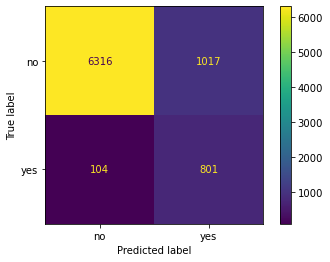

In [72]:
plot_confusion_matrix(model_clf, X_test, y_test)  
plt.show()

##### K-Fold Cross Validation

In [148]:
scores = cross_val_score(model_clf, X, y, cv=20, scoring='f1_micro')
scores

array([0.89320388, 0.85194175, 0.76893204, 0.8315534 , 0.68640777,
       0.71213592, 0.75291262, 0.74854369, 0.7406508 , 0.80718796,
       0.77027683, 0.73482273, 0.75570665, 0.71976688, 0.27974745,
       0.25303545, 0.56969403, 0.63380282, 0.30160272, 0.11267606])

In [149]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.65 f1_score with a standard deviation of 0.22


##### B. Grid Search CV

Vamos a optimizar el Random Forest con un grid search en 4 pasos:

1. Generamos un diccionario con los hiperparámetros a optimizar
2. Intanciamos el grid search con el modelo elegido, los parámetros elegidos, la métrica de validación, la cantidad de folds para el cross validations y la cantidad de nucleos a usar
3. Entrenamos el grid search instanciado
4. Vemos los resultados

In [16]:
# 1 Creamos el un diccionario con los parámetros

parametros = {
                    'max_depth': [80, 90, 100, 110],
                    'max_features': [2, 3],
                    'min_samples_leaf': [3, 4, 5],
                    'min_samples_split': [8, 10, 12],
                    'n_estimators': [100, 200, 300, 1000]
             }

In [17]:
# 2 Instanciamos el grid search

rf = RandomForestClassifier()

grid_rf = GridSearchCV(estimator = rf, param_grid = parametros, scoring='f1', n_jobs = -1, verbose = 2)

In [18]:
# 3 Entrenamos

grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan

GridSearchCV(estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [80, 90, 100, 110],
                         'max_features': [2, 3], 'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [100, 200, 300, 1000]},
             scoring='f1', verbose=2)

In [20]:
# 4 Vemos los resultados del grid search

resultados = pd.DataFrame(grid_rf.cv_results_).sort_values("rank_test_score")

resultados.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,7.773514,0.560686,0.692281,0.081485,80,2,3,8,100,"{'max_depth': 80, 'max_features': 2, 'min_samp...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
195,40.578650,0.369399,1.882124,0.022591,100,3,4,8,1000,"{'max_depth': 100, 'max_features': 3, 'min_sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
194,12.069257,0.153225,0.599369,0.054556,100,3,4,8,300,"{'max_depth': 100, 'max_features': 3, 'min_sam...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


In [21]:
print(grid_rf.best_params_)
grid_predictions = grid_rf.predict(X_test) 

{'max_depth': 80, 'max_features': 2, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 100}


In [22]:
# print classification report 
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

          no       0.94      0.96      0.95      7333
         yes       0.63      0.54      0.58       905

    accuracy                           0.92      8238
   macro avg       0.79      0.75      0.77      8238
weighted avg       0.91      0.92      0.91      8238



##### C. Random Search

In [363]:
# Grilla para Random Search
param_dist = {'max_depth': [80, 90, 100, 110],
                    'max_features': [2, 3],
                    'min_samples_leaf': [3, 4, 5],
                    'min_samples_split': [8, 10, 12],
                    'n_estimators': [100, 200, 300, 1000]}

#Aplicamos la grilla al modelo
model = RandomizedSearchCV(model_clf, param_dist,n_iter=100, random_state=0, cv=5)

In [ ]:
#Entrenamos KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

In [344]:
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'splitter': 'best', 'max_leaf_nodes': 35, 'max_depth': 30, 'criterion': 'gini'}
Mejor Score: 0.9127769347496206



In [345]:
#Analizamos qué obtuvimos
scores = pd.DataFrame(model.cv_results_)
scores.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_splitter,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.035223,0.001210,0.008217,0.001011,best,45,4,entropy,"{'splitter': 'best', 'max_leaf_nodes': 45, 'ma...",0.897876,0.908953,0.904097,0.909105,0.908042,0.905615,0.004276,51
1,0.024485,0.001029,0.007893,0.000244,random,35,10,gini,"{'splitter': 'random', 'max_leaf_nodes': 35, '...",0.904552,0.909256,0.904552,0.911229,0.904552,0.906829,0.002857,45
2,0.038759,0.000831,0.008091,0.000645,best,30,6,entropy,"{'splitter': 'best', 'max_leaf_nodes': 30, 'ma...",0.909863,0.916237,0.904401,0.914568,0.913505,0.911715,0.004212,17


In [346]:
#Prediccion
prediction = model.predict(X_test)

In [347]:
#F1 Score
print('F1 Score:', f1_score(y_test, prediction, average='micro'))

F1 Score: 0.9146637533381888


In [348]:
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[7070  263]
 [ 440  465]]


#### 3. K Nearest Neighbor (KNN)

Es un método que busca en las observaciones más cercanas a la que se está tratando de predecir y clasifica el punto de interés basado en la mayoría de datos que le rodean. Como dijimos antes, es un algoritmo:

- *Supervisado*: esto -brevemente- quiere decir que tenemos etiquetado nuestro conjunto de datos de entrenamiento, con la clase o resultado esperado dada “una fila” de datos.
- *Basado en Instancia*: Esto quiere decir que nuestro algoritmo no aprende explícitamente un modelo (como por ejemplo en Regresión Logística o árboles de decisión). En cambio memoriza las instancias de entrenamiento que son usadas como “base de conocimiento” para la fase de predicción.


**¿Cómo funciona kNN?**

1. Calcular la distancia entre el item a clasificar y el resto de items del dataset de entrenamiento.
2. Seleccionar los “k” elementos más cercanos (con menor distancia, según la función que se use)
3. Realizar una “votación de mayoría” entre los k puntos: los de una clase/etiqueta que dominen decidirán su clasificación final.

##### A. KNN

k=1 88.36 (+/- 0.44)
k=2 89.88 (+/- 0.40)
k=3 89.98 (+/- 0.36)
k=4 90.51 (+/- 0.30)
k=5 90.39 (+/- 0.36)
k=6 90.68 (+/- 0.32)
k=7 90.36 (+/- 0.36)
k=8 90.62 (+/- 0.29)
k=9 90.59 (+/- 0.38)
k=10 90.68 (+/- 0.36)
k=11 90.65 (+/- 0.51)
k=12 90.69 (+/- 0.30)
k=13 90.66 (+/- 0.40)
k=14 90.76 (+/- 0.33)
k=15 90.65 (+/- 0.44)
k=16 90.75 (+/- 0.41)
k=17 90.68 (+/- 0.34)
k=18 90.85 (+/- 0.32)
k=19 90.84 (+/- 0.36)
k=20 90.82 (+/- 0.39)
k=21 90.88 (+/- 0.35)
k=22 90.81 (+/- 0.39)
k=23 90.92 (+/- 0.26)
k=24 90.87 (+/- 0.34)
k=25 90.93 (+/- 0.32)
The optimal number of neighbors is 24 with 90.9%


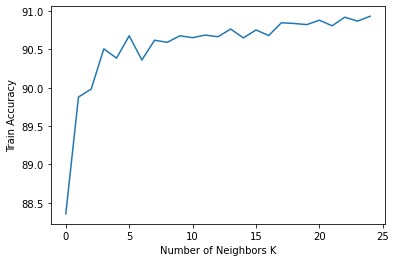

In [77]:
#Neighbors
neighbors = np.arange(0,25)

#Create empty list that will hold cv scores
cv_scores = []

#Perform 10-fold cross validation on training set for odd values of k:
for k in neighbors:
    k_value = k+1
    knn = KNeighborsClassifier(n_neighbors = k_value, weights='uniform', p=2, metric='euclidean')
    kfold = model_selection.KFold(n_splits=10)
    scores = model_selection.cross_val_score(knn, X_train, y_train, cv=kfold, scoring='accuracy')
    cv_scores.append(scores.mean()*100)
    print("k=%d %0.2f (+/- %0.2f)" % (k_value, scores.mean()*100, scores.std()*100))

optimal_k = neighbors[cv_scores.index(max(cv_scores))]
print ("The optimal number of neighbors is %d with %0.1f%%" % (optimal_k, cv_scores[optimal_k]))

plt.plot(neighbors, cv_scores)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Train Accuracy')
plt.show()

In [101]:
# Normalizamos en train porque así los modelos funcionan mejor
# Usamos StandardScaler para estandarizar, es la más común de todas pero hay otras

scaler_train = preprocessing.StandardScaler().fit(X_train)
X_train_scaled = scaler_train.transform(X_train)

Muchos algoritmos de aprendizaje automático funcionan mejor cuando las características están en una escala relativamente similar y cerca de la distribución normal. MinMaxScaler , RobustScaler , StandardScaler y Normalizer son métodos scikit-learn para preprocesar datos para el aprendizaje automático. El método que necesita, si corresponde, depende de su tipo de modelo y los valores de sus características.

El escalado y la estandarización pueden ayudar a que las características lleguen en una forma más digerible para estos algoritmos.

In [102]:
# se puede probar otros números para k
# se puede probar otras distancias, ej: euclidean, minkowski, manhattan 

knn = KNeighborsClassifier(n_neighbors=11, metric='euclidean') 
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=11)

In [103]:
y_pred_train = knn.predict(X_train_scaled)
f1_score(y_pred_train, y_train, average='micro')

0.9186949924127465

In [107]:
# Normalizamos en train

scaler_test = preprocessing.StandardScaler().fit(X_train)
X_test_scaled = scaler_test.transform(X_test)

In [105]:
y_pred_test = knn.predict(X_test_scaled)
f1_score(y_pred_test, y_test, average='micro')

0.9142995872784656

In [106]:
target_names = ['yes', 'no']
class_report = print(classification_report(y_test, y_pred_test, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.94      0.96      0.95      7333
          no       0.63      0.52      0.57       905

    accuracy                           0.91      8238
   macro avg       0.79      0.74      0.76      8238
weighted avg       0.91      0.91      0.91      8238



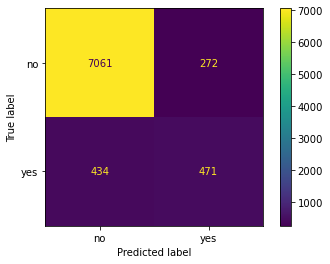

In [108]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

graph = plot_confusion_matrix(knn, X_test_scaled, y_test)  
graph

##### K-Fold Cross Validation

In [152]:
scores = cross_val_score(knn, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.84757282, 0.8592233 , 0.89466019, 0.78009709,
       0.83058252, 0.81553398, 0.8       , 0.8028169 , 0.864983  ,
       0.78970374, 0.83729966, 0.82127246, 0.66342885, 0.46284604,
       0.57697912, 0.67022827, 0.7620204 , 0.43176299, 0.16075765])

In [153]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.73 f1_score with a standard deviation of 0.18


##### B. Grid Search CV

Vamos a optimizar el modelo de KNN con un grid search en 4 pasos:

1. Generamos un diccionario con los hiperparámetros a optimizar
2. Intanciamos el grid search con el modelo elegido, los parámetros elegidos, la métrica de validación, la cantidad de folds para el cross validations y la cantidad de nucleos a usar
3. Entrenamos el grid search instanciado
4. Vemos los resultados

In [29]:
# 1 Creamos el un diccionario con los parámetros
parametros = {
                'n_neighbors': [5,8,11,15],
                'metric':['euclidean', 'manhattan'],
                'weights':['uniform', 'distance']    
             }

In [30]:
# 2 Instanciamos el grid search

grid_knn = GridSearchCV(KNeighborsClassifier(), parametros, scoring='f1', n_jobs=-1, cv=5, verbose=1)

In [31]:
# 3 Entrenamos
grid_knn.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]


GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [5, 8, 11, 15],
                         'weights': ['uniform', 'distance']},
             scoring='f1', verbose=1)

In [32]:
# 4 Vemos los resultados del grid search
resultados = pd.DataFrame(grid_knn.cv_results_).sort_values("rank_test_score")

resultados.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_metric,param_n_neighbors,param_weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.672489,0.032776,0.692124,0.017915,euclidean,5,uniform,"{'metric': 'euclidean', 'n_neighbors': 5, 'wei...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,0.624455,0.090960,0.335791,0.030386,euclidean,5,distance,"{'metric': 'euclidean', 'n_neighbors': 5, 'wei...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2,0.630305,0.022935,0.803755,0.026549,euclidean,8,uniform,"{'metric': 'euclidean', 'n_neighbors': 8, 'wei...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


In [33]:
print(grid_knn.best_params_)
grid_predictions = grid_knn.predict(X_test) 

{'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'uniform'}


In [61]:
# print classification report 
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

          no       0.93      0.97      0.95      7333
         yes       0.60      0.38      0.46       905

    accuracy                           0.90      8238
   macro avg       0.77      0.67      0.71      8238
weighted avg       0.89      0.90      0.89      8238



##### C. Random Search

In [16]:
# Grilla para Random Search
param_dist = {'n_neighbors':sp.stats.randint(1, 15),
              'weights': ['uniform', 'distance'], 
              'leaf_size':sp.stats.randint(1, 10),
              'algorithm':['auto', 'kd_tree']}

#Aplicamos la grilla al modelo
model = RandomizedSearchCV(knn, param_dist,n_iter=100, random_state=0, cv=5)

In [17]:
#Entrenamos KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=KNeighborsClassifier(metric='euclidean',
                                                  n_neighbors=11),
                   n_iter=100,
                   param_distributions={'algorithm': ['auto', 'kd_tree'],
                                        'leaf_size': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023FCFB54C70>,
                                        'n_neighbors': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023FCFB658B0>,
                                        'weights': ['uniform', 'distance']},
                   random_state=0)

In [18]:
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'algorithm': 'kd_tree', 'leaf_size': 3, 'n_neighbors': 12, 'weights': 'uniform'}
Mejor Score: 0.8946889226100152



In [21]:
#Analizamos qué obtuvimos
scores = pd.DataFrame(model.cv_results_)
scores.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_n_neighbors,param_weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.626849,0.030569,0.228492,0.023386,auto,6,1,distance,"{'algorithm': 'auto', 'leaf_size': 6, 'n_neigh...",0.820030,0.857511,0.852049,0.859788,0.848407,0.847557,0.014334,97
1,0.589108,0.030733,0.255118,0.005517,kd_tree,4,8,distance,"{'algorithm': 'kd_tree', 'leaf_size': 4, 'n_ne...",0.883763,0.892109,0.892716,0.892109,0.889530,0.890046,0.003328,61
2,0.576025,0.013582,0.440263,0.013747,kd_tree,6,3,uniform,"{'algorithm': 'kd_tree', 'leaf_size': 6, 'n_ne...",0.877390,0.885584,0.883156,0.889378,0.881032,0.883308,0.004056,87


In [22]:
#Prediccion
prediction = model.predict(X_test)

In [23]:
#F1 Score
print('F1 Score:', f1_score(y_test, prediction, average='micro'))

F1 Score: 0.895241563486283


In [27]:
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[7194  139]
 [ 724  181]]


#### 4. Regresión Logistica

La regresión logística es un algoritmo de clasificación que se utiliza para asignar observaciones a un conjunto discreto de clases. Pertenece al aprendizaje automático que se utiliza para los problemas de clasificación, es un algoritmo de análisis predictivo y se basa en el concepto de probabilidad. La hipótesis de regresión logística tiende a limitar la función de costo entre 0 y 1.


##### A. Regresión Logistica

In [140]:
random_seed = 7

features = [ 'contact', 'month', 'day_of_week', 'duration','cons.conf.idx', 'euribor3m', 'nr.employed', 'pdays']

# Variable a predecir
target = 'y'

# Creacion de las matrices de entrenamiento y testeo. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=random_seed)
print('Dimensión de la matriz de features para entrenamiento: {}'.format(X_train.shape))
print('Dimensión de la matriz de features para testeo: {}'.format(X_test.shape))

Dimensión de la matriz de features para entrenamiento: (32950, 8)
Dimensión de la matriz de features para testeo: (8238, 8)


In [141]:
regLog = LogisticRegression(penalty = 'none') # Inicializamos nuevamente el modelo
regLog.fit(X_train,  y_train)

score_in_train = regLog.score(X_train, y_train) # Es el score del ajuste 
beta_0 = regLog.intercept_ # El beta 0
beta_1 = regLog.coef_[0][0] # El coeficiente beta_1
beta_2 = regLog.coef_[0][1] # El coeficiente beta_2

# Score del modelo en el conjunto de testeo
score_in_test = regLog.score(X_test, y_test)

print('Score en el set de entrenamiento: {}'.format(score_in_train))
print('Score en el set de testeo: {}'.format(score_in_test))

Score en el set de entrenamiento: 0.9074962063732929
Score en el set de testeo: 0.9082301529497451


**Classification Report:**

In [142]:
target_names = ['yes', 'no']
class_report = print(classification_report(y_pred_train, y_train, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.87      0.99      0.92     25627
          no       0.92      0.47      0.62      7323

    accuracy                           0.87     32950
   macro avg       0.90      0.73      0.77     32950
weighted avg       0.88      0.87      0.86     32950



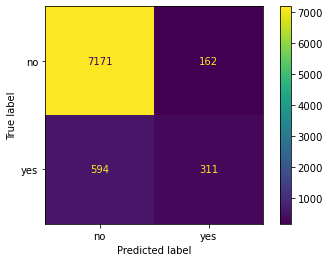

In [143]:
## ploteamos matríz de confusión para ver cuantos aciertos y desaciertos hubo

plot_confusion_matrix(regLog, X_test, y_test)  
plt.show()

##### K-Fold Cross Validation

In [154]:
scores = cross_val_score(regLog, X, y, cv=20, scoring='f1_micro')
scores

C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
C:\Users\USUARIO\anaconda3\lib\site-packag

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.88737864,
       0.88834951, 0.9131068 , 0.91359223, 0.94997572, 0.9538611 ,
       0.90966489, 0.92374939, 0.95288975, 0.94754735, 0.8455561 ,
       0.90383681, 0.93006314, 0.93297717, 0.8436134 , 0.62603205])

In [155]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.89 f1_score with a standard deviation of 0.07


##### B. Grid Search CV

Vamos a optimizar la regresión logistica con un grid search en 4 pasos:

1. Generamos un diccionario con los hiperparámetros a optimizar
2. Intanciamos el grid search con el modelo elegido, los parámetros elegidos, la métrica de validación, la cantidad de folds para el cross validations y la cantidad de nucleos a usar
3. Entrenamos el grid search instanciado
4. Vemos los resultados

In [37]:
# 1 Creamos el un diccionario con los parámetros
parametros = {
                "C": np.linspace(0.001, 10, 30),
                "fit_intercept": [True,False],
                "penalty":['l2'],
                "class_weight": [None, "balanced"]
             }

In [38]:
# 2 Instanciamos el grid search

# Usamos como métrica el f1 score porque las clases están algo desbalanceadas. Con esta métrica se elige el mejor modelo
# Ponemos n_jobs = -1 para que use todos los cores disponibles
# Con verbose para ver la información del entrenamiento. Mientras más alto más mensajes
# Hacemos un cross validation de 5 folds

grid_logistica = GridSearchCV(LogisticRegression(), parametros, scoring='f1', n_jobs=-1, cv=5, verbose=1)

In [39]:
# 3 Entrenamos
grid_logistica.fit(X_train, y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan]


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-03, 3.45793103e-01, 6.90586207e-01, 1.03537931e+00,
       1.38017241e+00, 1.72496552e+00, 2.06975862e+00, 2.41455172e+00,
       2.75934483e+00, 3.10413793e+00, 3.44893103e+00, 3.79372414e+00,
       4.13851724e+00, 4.48331034e+00, 4.82810345e+00, 5.17289655e+00,
       5.51768966e+00, 5.86248276e+00, 6.20727586e+00, 6.55206897e+00,
       6.89686207e+00, 7.24165517e+00, 7.58644828e+00, 7.93124138e+00,
       8.27603448e+00, 8.62082759e+00, 8.96562069e+00, 9.31041379e+00,
       9.65520690e+00, 1.00000000e+01]),
                         'class_weight': [None, 'balanced'],
                         'fit_intercept': [True, False], 'penalty': ['l2']},
             scoring='f1', verbose=1)

In [40]:
# 4 Vemos los resultados del grid search
resultados = pd.DataFrame(grid_logistica.cv_results_).sort_values("rank_test_score")

resultados.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_fit_intercept,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.683876,0.022746,0.078639,0.005552,0.001,None,True,l2,"{'C': 0.001, 'class_weight': None, 'fit_interc...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
87,0.569154,0.050040,0.073750,0.015816,7.241655,balanced,False,l2,"{'C': 7.241655172413794, 'class_weight': 'bala...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
86,0.580125,0.048100,0.102256,0.040945,7.241655,balanced,True,l2,"{'C': 7.241655172413794, 'class_weight': 'bala...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


In [41]:
print(grid_logistica.best_params_)
grid_predictions = grid_logistica.predict(X_test) 

{'C': 0.001, 'class_weight': None, 'fit_intercept': True, 'penalty': 'l2'}


In [52]:
# print classification report 
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

          no       0.92      0.98      0.95      7333
         yes       0.64      0.35      0.45       905

    accuracy                           0.91      8238
   macro avg       0.78      0.66      0.70      8238
weighted avg       0.89      0.91      0.89      8238



##### C. Random Search

In [349]:
# Grilla para Random Search
param_dist = {"C": np.linspace(0.001, 10, 30),
                "fit_intercept": [True,False],
                "penalty":['l2'],
                "class_weight": [None, "balanced"]}

#Aplicamos la grilla al modelo
model = RandomizedSearchCV(regLog, param_dist,n_iter=100, random_state=0, cv=5)

In [350]:
#Entrenamos KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=LogisticRegression(penalty='none'),
                   n_iter=100,
                   param_distributions={'C': array([1.00000000e-03, 3.45793103e-01, 6.90586207e-01, 1.03537931e+00,
       1.38017241e+00, 1.72496552e+00, 2.06975862e+00, 2.41455172e+00,
       2.75934483e+00, 3.10413793e+00, 3.44893103e+00, 3.79372414e+00,
       4.13851724e+00, 4.48331034e+00, 4.82810345e+00, 5.17289655e+00,
       5.51768966e+00, 5.86248276e+00, 6.20727586e+00, 6.55206897e+00,
       6.89686207e+00, 7.24165517e+00, 7.58644828e+00, 7.93124138e+00,
       8.27603448e+00, 8.62082759e+00, 8.96562069e+00, 9.31041379e+00,
       9.65520690e+00, 1.00000000e+01]),
                                        'class_weight': [None, 'balanced'],
                                        'fit_intercept': [True, False],
                                        'penalty': ['l2']},
                   random_state=0)

In [351]:
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 0.6905862068965518}
Mejor Score: 0.9057359635811835



In [352]:
#Analizamos qué obtuvimos
scores = pd.DataFrame(model.cv_results_)
scores.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_penalty,param_fit_intercept,param_class_weight,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.127456,0.019705,0.007999,0.000236,l2,True,None,4.138517,"{'penalty': 'l2', 'fit_intercept': True, 'clas...",0.901214,0.908498,0.90258,0.906980,0.909256,0.905706,0.003224,2
1,0.121711,0.013254,0.008822,0.000633,l2,True,balanced,7.931241,"{'penalty': 'l2', 'fit_intercept': True, 'clas...",0.835964,0.839605,0.84871,0.839757,0.844765,0.841760,0.004463,54
2,0.108772,0.006704,0.008090,0.000607,l2,False,balanced,7.931241,"{'penalty': 'l2', 'fit_intercept': False, 'cla...",0.835964,0.839605,0.84871,0.839757,0.844765,0.841760,0.004463,54


In [353]:
#Prediccion
prediction = model.predict(X_test)

In [354]:
#F1 Score
print('F1 Score:', f1_score(y_test, prediction, average='micro'))

F1 Score: 0.9075018208302986


In [355]:
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[7150  183]
 [ 579  326]]


#### 5. Support Vector Machine

El algoritmo de Support Vector Machine es encontrar un hiperplano en un espacio N-dimensional (N - el número de características) que clasifica claramente los puntos de datos.

Para separar las dos clases de puntos de datos, hay muchos hiperplanos posibles que podrían elegirse. Nuestro objetivo es encontrar un plano que tenga el margen máximo, es decir, la distancia máxima entre puntos de datos de ambas clases. Maximizar la distancia del margen proporciona cierto refuerzo para que los puntos de datos futuros se puedan clasificar con más confianza.

Ahora podemos muestrear rápidamente un conjunto de entrenamiento mientras almacenamos el 40% de los datos para probar (evaluar) nuestro clasificador:

##### A. SVM

In [147]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0) #dividimos en train y test, al igual que antes
X_train.shape, y_train.shape
X_test.shape, y_test.shape

clf = svm.SVC(kernel='linear', C=1).fit(X_train, y_train) #llamamos a la función que previamente importamos 
clf.score(X_test, y_test) #vemos el score

0.9015537751881525

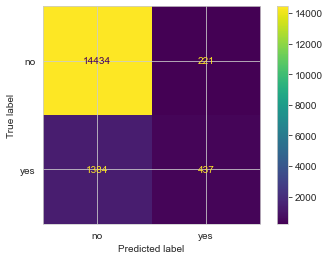

In [69]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

plot_confusion_matrix(clf, X_test, y_test)  
plt.show()

##### K-Fold Cross Validation

In [131]:
scores = cross_val_score(clf, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.89805825,
       0.88737864, 0.86262136, 0.84417476, 0.83341428, 0.85915493,
       0.88149587, 0.87761049, 0.90675085, 0.87663915, 0.79990287,
       0.79893152, 0.90820787, 0.79116076, 0.65274405, 0.15687227])

In [132]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.82 accuracy with a standard deviation of 0.16


##### B. Grid Search CV

Vamos a optimizar el Tree Decision con un grid search en 4 pasos:

1. Generamos un diccionario con los hiperparámetros a optimizar
2. Intanciamos el grid search con el modelo elegido, los parámetros elegidos, la métrica de validación, la cantidad de folds para el cross validations y la cantidad de nucleos a usar
3. Entrenamos el grid search instanciado
4. Vemos los resultados

In [148]:
# 1 Creamos el un diccionario con los parámetros
parametros = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']
             }

In [149]:
# 2 Instanciamos el grid search

grid_svm = GridSearchCV(svm.SVC(), parametros, refit = True, verbose = 3, cv=5, scoring='f1', n_jobs = -1)

In [150]:
# 3 Entrenamos
grid_svm.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan]


GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             scoring='f1', verbose=3)

In [151]:
# 4 Vemos los resultados del grid search
resultados = pd.DataFrame(grid_svm.cv_results_).sort_values("rank_test_score")

resultados.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,223.931420,2.456580,43.775150,0.180240,0.1,1,rbf,"{'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
22,102.197620,7.934490,7.916200,0.151330,1000,0.01,rbf,"{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
21,204.397892,3.595408,22.325414,1.950771,1000,0.1,rbf,"{'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


In [154]:
print(grid_svm.best_params_)
grid_predictions = grid_svm.predict(X_test) 

{'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}


In [155]:
# print classification report 
print(classification_report(y_test, grid_predictions))

C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

          no       0.89      1.00      0.94     14655
         yes       0.00      0.00      0.00      1821

    accuracy                           0.89     16476
   macro avg       0.44      0.50      0.47     16476
weighted avg       0.79      0.89      0.84     16476



C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


##### C. Random Search

In [356]:
# Grilla para Random Search
param_dist = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']
             }

#Aplicamos la grilla al modelo
model = RandomizedSearchCV(clf, param_dist,n_iter=100, random_state=0, cv=5)

In [357]:
#Entrenamos KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

C:\Users\USUARIO\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:285: UserWarning: The total space of parameters 25 is smaller than n_iter=100. Running 25 iterations. For exhaustive searches, use GridSearchCV.


[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: C
[LightGBM] [Warning] Unknown parameter: kernel
[LightGB

RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_iter=100,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf']},
                   random_state=0)

In [358]:
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'kernel': 'rbf', 'gamma': 1, 'C': 0.1}
Mejor Score: 0.9122306525037935



In [359]:
#Analizamos qué obtuvimos
scores = pd.DataFrame(model.cv_results_)
scores.head(3)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_kernel,param_gamma,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.123254,0.011006,0.021311,0.001961,rbf,1,0.1,"{'kernel': 'rbf', 'gamma': 1, 'C': 0.1}",0.908801,0.917451,0.910774,0.914112,0.910015,0.912231,0.003149,1
1,0.122602,0.005765,0.020909,0.001600,rbf,0.1,0.1,"{'kernel': 'rbf', 'gamma': 0.1, 'C': 0.1}",0.908801,0.917451,0.910774,0.914112,0.910015,0.912231,0.003149,1
2,0.124367,0.006582,0.021586,0.001942,rbf,0.01,0.1,"{'kernel': 'rbf', 'gamma': 0.01, 'C': 0.1}",0.908801,0.917451,0.910774,0.914112,0.910015,0.912231,0.003149,1


In [360]:
#Prediccion
prediction = model.predict(X_test)

In [361]:
#F1 Score
print('F1 Score:', f1_score(y_test, prediction, average='micro'))

F1 Score: 0.915877640203933


In [362]:
# Matriz de Confusion
cm = confusion_matrix(y_test,prediction)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[7065  268]
 [ 425  480]]


### Métodos de ensamble

El ensamblado permite combinar un conjunto de diversos de modelos para improvisar sobre la estabilidad y el poder predictivo del modelo.

En si, son algoritmos formados por algoritmos más simples. Estos algoritmos simples, se unen para formar un algoritmo más potente.

Aunque hay diversas formas de ensamblar o unir algoritmos débiles para formar otros, las más usadas y populares son el **bagging** y el **boosting**.
Cada tipo de algoritmo tiene unas ventajas y desventajas, pudiendo ser usados convenientemente según sea nuestra problemática a resolver.

Haremos métodos de boosting porque bagging ya realizamos previamente: Random Forest.

##### Métodos de Boosting

En los algoritmos de boosting, los modelos simples son utilizados secuencialmente, es decir, cada modelo simple va delante o detrás de otro modelo simple. 
El principal objetivo de los métodos secuenciales es el de aprovecharse de la dependencia entre los modelos simples.

El rendimiento general puede ser mejorado haciendo que un modelo simple posterior, le dé más importancia a los errores cometidos por un modelo simple previo.
Sería como si nosotros al resolver un problema, aprovechásemos nuestro conocimiento de los errores de otros para mejorar en algo intentando no cometerlos nosotros.

Las predicciones de cada modelo simple se combinan por medio de una votación en problemas de clasificación.

Algoritmos de boosting:
1. XG BOOSTING
2. ADABOOST
3. GRADIENT BOOSTING
4. LIGHT GBM

##### 1. XG Boosting

Extreme Gradient Boosting, es uno de los algoritmos de machine learning de tipo supervisado más usados en la actualidad. Este algoritmo se caracteriza por obtener buenos resultados de predicción con relativamente poco esfuerzo, en muchos casos equiparables o mejores que los devueltos por modelos más complejos computacionalmente, en particular para problemas con datos heterogéneos.

Se basa en el principio de “boosting”, que como bien sabemos, consiste en generar múltiples modelos de predicción “débiles” secuencialmente y que cada uno de estos tome los resultados del modelo anterior, para generar un modelo más “fuerte”, con mejor poder predictivo y mayor estabilidad en sus resultados.

Para conseguir un modelo más fuerte, se emplea un algoritmo de optimización, este caso Gradient Descent (descenso de gradiente). Durante el entrenamiento, los parámetros de cada modelo débil son ajustados iterativamente tratando de encontrar el mínimo de una función objetivo, que puede ser la proporción de error en la clasificación, el área bajo la curva (AUC), la raíz del error cuadrático medio (RMSE), etc.

Cada modelo es comparado con el anterior. Si un nuevo modelo tiene mejores resultados, entonces se toma este como base para realizar nuevas modificaciones. Si, por el contrario, tiene peores resultados, se regresa al mejor modelo anterior y se modifica ese de una manera diferente.

In [115]:
features = [ 'contact', 'month', 'day_of_week', 'duration','cons.conf.idx', 'euribor3m', 'nr.employed', 'pdays']

# Variable a predecir
target = 'y'

# Construcción de la matríz de features
X = df[features].to_numpy()

# Construcción del vector a predecir
y = df[target].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0) #dividimos en train y test, al igual que antes

clf_xgb = xgb.XGBClassifier(objective='binary:logistic', n_estimators=10,seed=7)

#Entrenamos el modelo
clf_xgb.fit(X_train,y_train) 

[00:38:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=10, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=7,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=7,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [117]:
y_train_pred = clf_xgb.predict(X_train) #Prediccion en Train
y_test_pred = clf_xgb.predict(X_test) #Prediccion en Test

In [121]:
#Calculo el f1 en Train
train_score = f1_score(y_train, y_train_pred, average='micro')

#Calculo el accuracy en Test
test_score = f1_score(y_test, y_test_pred, average='micro')

print('% de aciertos sobre el set de entrenamiento:', train_score)
print('% de aciertos sobre el set de evaluación:',test_score)

% de aciertos sobre el set de entrenamiento: 0.9202816445451603
% de aciertos sobre el set de evaluación: 0.9181233309055596


##### K-Fold Cross Validation

In [156]:
scores = cross_val_score(clf_xgb, X, y, cv=20, scoring='f1_micro')
scores

C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
C:\Users\USUARIO\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[00:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


array([0.88737864, 0.87912621, 0.85485437, 0.86990291, 0.8538835 ,
       0.85436893, 0.86407767, 0.85291262, 0.85186984, 0.86206897,
       0.87469645, 0.87129675, 0.8188441 , 0.79456047, 0.38659543,
       0.4672171 , 0.85624089, 0.73336571, 0.37542496, 0.1136474 ])

In [157]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.75 f1_score with a standard deviation of 0.22


##### 2. AdaBoost

Este algoritmo entrena de forma secuencial un conjunto de aprendices débiles a partir de un algoritmo base común. Todos los aprendices son entrenados con el mismo conjunto de datos pero éstos van recibiendo pesos que dependen de los errores cometidos por cada aprendiz. 
Así, inicialmente todos las muestras reciben un peso inicial wi de 1/n (suponiendo que haya n muestras). El primer aprendiz es entrenado y se estima su tasa de error. 

In [158]:
#Separación en Train y Test
ada = AdaBoostClassifier(n_estimators=50,learning_rate=1)


#Fiteamos el modelo
model = ada.fit(X_train, y_train)


#Predicción
y_pred = model.predict(X_test)

In [320]:
#F1 Score

print("F1 Score:", f1_score(y_test, y_pred, average='micro'))

F1 Score: 0.9101723719349356


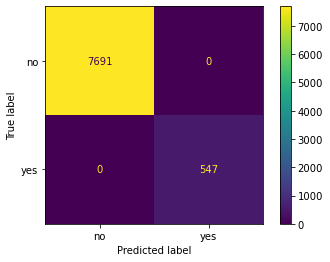

In [319]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

plot_confusion_matrix(ada, X_test, y_pred)  
plt.show()

##### K-Fold Cross Validation

In [159]:
scores = cross_val_score(ada, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.88737864,
       0.88883495, 0.92135922, 0.91116505, 0.90286547, 0.88003885,
       0.89460903, 0.90917921, 0.88538125, 0.81932977, 0.67702768,
       0.80864497, 0.91500729, 0.79893152, 0.67168528, 0.1136474 ])

In [160]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.82 f1_score with a standard deviation of 0.18


##### 3. Gradient Boosting

El aumento de gradiente es un tipo de algoritmo de aumento. Se basa en la intuición de que el mejor modelo siguiente posible, cuando se combina con modelos anteriores, minimiza el error de predicción general. 

La idea clave es establecer los resultados objetivo para este próximo modelo con el fin de minimizar el error. El aumento de gradiente se puede utilizar tanto para clasificación como para regresión.

In [161]:
gbrt = GradientBoostingClassifier(random_state = 7)
gbrt.fit(X_train, y_train)
y_pred = gbrt.predict(X_test)

print("Score train:", gbrt.score(X_train, y_train))
print("Score test:", gbrt.score(X_test, y_test))

Score train: 0.9166616084977238
Score test: 0.9172129157562515


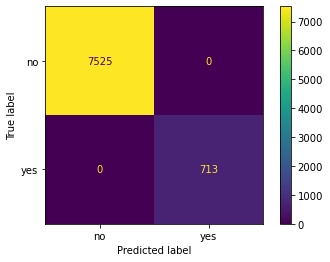

In [317]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

plot_confusion_matrix(gbrt, X_test, y_pred)  
plt.show()

##### K-Fold Cross Validation

In [162]:
scores = cross_val_score(gbrt, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.85436893,
       0.85436893, 0.8631068 , 0.8538835 , 0.84215639, 0.86304031,
       0.88052453, 0.86886838, 0.8188441 , 0.85575522, 0.41476445,
       0.55852356, 0.85866926, 0.75813502, 0.47353084, 0.11267606])

In [163]:
print("%0.2f f1_score con una desviación estandar de %0.2f" % (scores.mean(), scores.std()))

0.76 f1_score with a standard deviation of 0.20


##### 4. LightGBM

Utiliza la técnica Gradient Boosting. Con este método los árboles se construyen de manera secuencial y cada uno que se agrega aporta su granito de arena para refinar la predicción anterior. Es decir, se comienza con un valor constante y cada árbol nuevo se entrena para predecir el error en la suma de todas las predicciones de los árboles anteriores.

Una vez terminado el proceso, las predicciones se calculan sumando los resultados de todos los árboles que se construyeron. El efecto que tiene esto es que cada vez que se agrega un árbol nuevo se le presta atención a las muestras en las que el modelo está funcionando peor y se trabaja para mejorar ese aspecto.

In [172]:
lgbm = lgb.LGBMClassifier()
lgbm.fit(X_train, y_train)
y_pred = lgbm.predict(X_test)

In [173]:
lgbm.score(X_test, y_test)

print("Score train:", clf.score(X_train, y_train))
print("Score test:", clf.score(X_test, y_test))

Score train: 0.9244916540212443
Score test: 0.915877640203933


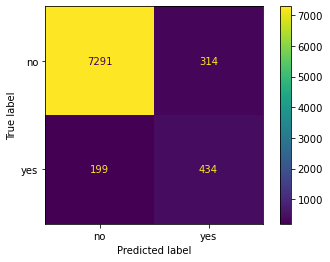

In [313]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

plot_confusion_matrix(clf, X_test, y_pred)  
plt.show()

##### K-Fold Cross Validation

In [174]:
scores = cross_val_score(lgbm, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.87572816, 0.85485437, 0.8684466 , 0.71990291,
       0.72135922, 0.82961165, 0.83398058, 0.82807188, 0.84312773,
       0.73870811, 0.7867897 , 0.80961632, 0.79650316, 0.32442933,
       0.36376882, 0.73142302, 0.6731423 , 0.31811559, 0.11267606])

In [175]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.70 f1_score with a standard deviation of 0.22


##### 5. GaussianNB

In [177]:
gaussiannb= GaussianNB()
gaussiannb.fit(X_train, y_train)
gaussiannbpred = gaussiannb.predict(X_test)
probs = gaussiannb.predict(X_test)

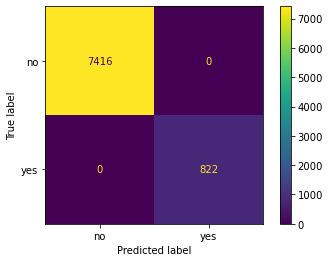

In [178]:
# Siempre que hay un problema de clasificación, hacemos una matríz de confusión

plot_confusion_matrix(gaussiannb, X_test, gaussiannbpred)  
plt.show()

In [179]:
#F1 Score
print('F1 Score:', f1_score(y_test, probs, average='micro'))

F1 Score: 0.8971837824714737


##### K-Fold Cross Validation

In [180]:
scores = cross_val_score(gaussiannb, X, y, cv=20, scoring='f1_micro')
scores

array([0.88737864, 0.88737864, 0.88737864, 0.88737864, 0.88737864,
       0.8907767 , 0.91359223, 0.91796117, 0.94269063, 0.91792132,
       0.91063623, 0.92569208, 0.94900437, 0.98348713, 0.85526955,
       0.85866926, 0.9538611 , 0.96308888, 0.85235551, 0.20641088])

In [181]:
print("%0.2f f1_score with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.87 f1_score with a standard deviation of 0.16


### Tratamiento dataset desbalanceado

En los problemas de clasificación solemos encontrar que en nuestro conjunto de datos de entrenamiento contamos con que alguna de las clases de muestra es una clase “minoritaria” es decir, de la cual tenemos muy poquitas muestras. Esto provoca un desbalanceo en los datos que utilizaremos para el entrenamiento de nuestra máquina.

Por lo general afecta a los algoritmos en su proceso de generalización de la información y perjudicando a las clases minoritarias.

Si medimos la efectividad de nuestro modelo por la cantidad de aciertos que tuvo, sólo teniendo en cuenta a la clase mayoritaria podemos estar teniendo una falsa sensación de que el modelo funciona bien.

##### Estrategias para el manejo de Datos Desbalanceados:

Tenemos diversas estrategias para tratar de mejorar la situación. Las comentaremos brevemente y pasaremos a la acción (al código!) a continuación.

1. **Ajuste de Parámetros del modelo:** Consiste en ajustar parametros ó metricas del propio algoritmo para intentar equilibrar a la clase minoritaria penalizando a la clase mayoritaria durante el entrenamiento. Ejemplos on ajuste de peso en árboles, también en logisticregression tenemos el parámetro class_weight= “balanced” que utilizaremos en este ejemplo. No todos los algoritmos tienen estas posibilidades. En redes neuronales por ejemplo podríamos ajustar la métrica de Loss para que penalice a las clases mayoritarias.

2. **Modificar el Dataset:** podemos eliminar muestras de la clase mayoritaria para reducirlo e intentar equilibrar la situación. Tiene como “peligroso” que podemos prescindir de muestras importantes, que brindan información y por lo tanto empeorar el modelo. Entonces para seleccionar qué muestras eliminar, deberíamos seguir algún criterio. También podríamos agregar nuevas filas con los mismos valores de las clases minoritarias, por ejemplo cuadriplicar nuestras 492 filas. Pero esto no sirve demasiado y podemos llevar al modelo a caer en overfitting.

3. **Muestras artificiales:** podemos intentar crear muestras sintéticas (no idénticas) utilizando diversos algoritmos que intentan seguir la tendencia del grupo minoritario. Según el método, podemos mejorar los resultados. Lo peligroso de crear muestras sintéticas es que podemos alterar la distribución “natural” de esa clase y confundir al modelo en su clasificación.

4. **Balanced Ensemble Methods:** Utiliza las ventajas de hacer ensamble de métodos, es decir, entrenar diversos modelos y entre todos obtener el resultado final (por ejemplo “votando”) pero se asegura de tomar muestras de entrenamiento equilibradas.

La primera de estas estratégias ya la fuimos probando a lo largo del dataset aplicando el **grid_searchCV**, lo cual reajustó los parámetros de nuestros modelos en base a lo que el dataset demandaba. 

##### Estrategia: Subsampling en la clase mayoritaria por modelo

Lo que haremos es utilizar un algoritmo para reducir la clase mayoritaria. 

**Tree Decision**

In [58]:
#creamos una función que crea el modelo que usaremos cada vez
def run_model(X_train, X_test, y_train, y_test):
    clf_base = DecisionTreeClassifier(max_leaf_nodes = 40, max_depth = 4)
    clf_base.fit(X_train, y_train)
    return clf_base

In [59]:
us = NearMiss(sampling_strategy=0.8, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)
 
print ("Distribucion antes del resampling {}".format(Counter(y_train)))
print ("Distribucion después del resampling {}".format(Counter(y_train_res)))

Distribucion antes del resampling Counter({'no': 29215, 'yes': 3735})
Distribucion después del resampling Counter({'no': 4668, 'yes': 3735})


In [60]:
model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)

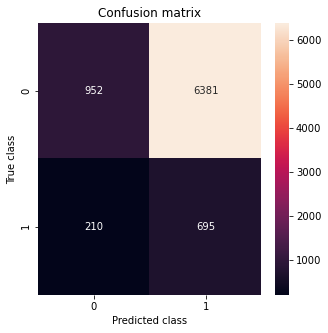

In [61]:
conf_matrix = confusion_matrix(y_test, pred_y)  
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [62]:
print (classification_report(y_test, pred_y))

              precision    recall  f1-score   support

          no       0.82      0.13      0.22      7333
         yes       0.10      0.77      0.17       905

    accuracy                           0.20      8238
   macro avg       0.46      0.45      0.20      8238
weighted avg       0.74      0.20      0.22      8238



**Random Forest**

In [64]:
#creamos una función que crea el modelo que usaremos cada vez
def run_model(X_train, X_test, y_tran, y_test):
    clf_base = RandomForestClassifier()
    clf_base.fit(X_train, y_train)
    return clf_base

In [65]:
us = NearMiss(sampling_strategy=0.8, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)
 
print ("Distribucion antes del resampling {}".format(Counter(y_train)))
print ("Distribucion después del resampling {}".format(Counter(y_train_res)))

Distribucion antes del resampling Counter({'no': 29215, 'yes': 3735})
Distribucion después del resampling Counter({'no': 4668, 'yes': 3735})


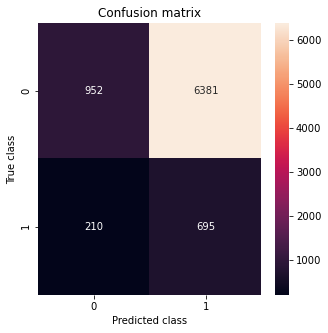

In [66]:
conf_matrix = confusion_matrix(y_test, pred_y)  
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [86]:
print (classification_report(y_test, pred_y))

              precision    recall  f1-score   support

          no       0.82      0.13      0.22      7333
         yes       0.10      0.77      0.17       905

    accuracy                           0.20      8238
   macro avg       0.46      0.45      0.20      8238
weighted avg       0.74      0.20      0.22      8238



**KNN**

In [45]:
modelo = DecisionTreeClassifier(max_leaf_nodes = 40, max_depth = 4)
parametros = {
                "X_train",
                "X_test",
                "y_train",
                "y_test"
             }

In [46]:
#creamos una función que crea el modelo que usaremos cada vez
def run_model(X_train, X_test, modelo, parametros):
    modelo: modelo
    parametros: parametros
    clf_base = modelo(X_train, X_test, y_train, y_test)
    clf_base.fit(X_train, y_train)
    return clf_base

In [46]:
us = NearMiss(sampling_strategy=0.8, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)
 
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))

Distribution before resampling Counter({'no': 29238, 'yes': 3712})
Distribution after resampling Counter({'no': 4640, 'yes': 3712})


In [47]:
model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)

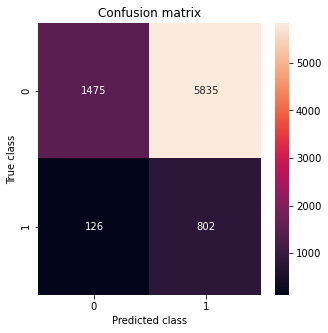

In [48]:
confusion_matrix(y_test, pred_y) 
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [108]:
print (classification_report(y_test, pred_y))

              precision    recall  f1-score   support

          no       0.81      0.24      0.37     14601
         yes       0.09      0.56      0.15      1875

    accuracy                           0.28     16476
   macro avg       0.45      0.40      0.26     16476
weighted avg       0.73      0.28      0.35     16476



**Regresión Logística**

In [45]:
modelo = DecisionTreeClassifier(max_leaf_nodes = 40, max_depth = 4)
parametros = {
                "X_train",
                "X_test",
                "y_train",
                "y_test"
             }

In [46]:
#creamos una función que crea el modelo que usaremos cada vez
def run_model(X_train, X_test, modelo, parametros):
    modelo: modelo
    parametros: parametros
    clf_base = modelo(X_train, X_test, y_train, y_test)
    clf_base.fit(X_train, y_train)
    return clf_base

In [50]:
us = NearMiss(sampling_strategy=0.8, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)
 
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))

Distribution before resampling Counter({'no': 29238, 'yes': 3712})
Distribution after resampling Counter({'no': 4640, 'yes': 3712})


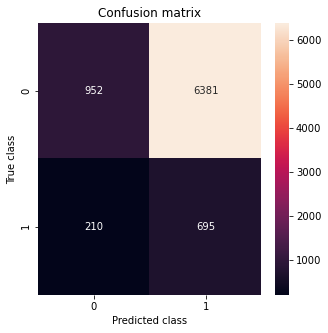

In [101]:
confusion_matrix(y_test, pred_y) 
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [102]:
print (classification_report(y_test, pred_y))

              precision    recall  f1-score   support

          no       0.76      0.14      0.24      7333
         yes       0.08      0.64      0.15       905

    accuracy                           0.19      8238
   macro avg       0.42      0.39      0.19      8238
weighted avg       0.69      0.19      0.23      8238



**SVM**

In [45]:
modelo = DecisionTreeClassifier(max_leaf_nodes = 40, max_depth = 4)
parametros = {
                "X_train",
                "X_test",
                "y_train",
                "y_test"
             }

In [46]:
#creamos una función que crea el modelo que usaremos cada vez
def run_model(X_train, X_test, modelo, parametros):
    modelo: modelo
    parametros: parametros
    clf_base = modelo(X_train, X_test, y_train, y_test)
    clf_base.fit(X_train, y_train)
    return clf_base

In [104]:
us = NearMiss(sampling_strategy=0.8, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)
 
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))

Distribution before resampling Counter({'no': 29215, 'yes': 3735})
Distribution after resampling Counter({'no': 7470, 'yes': 3735})


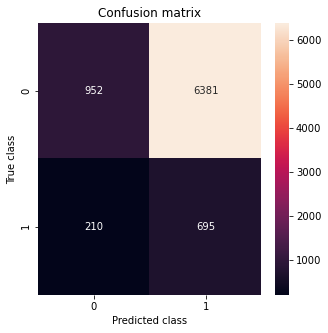

In [101]:
confusion_matrix(y_test, pred_y) 
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [102]:
print (classification_report(y_test, pred_y))

              precision    recall  f1-score   support

          no       0.76      0.14      0.24      7333
         yes       0.08      0.64      0.15       905

    accuracy                           0.19      8238
   macro avg       0.42      0.39      0.19      8238
weighted avg       0.69      0.19      0.23      8238



##### Estrategia: Combinamos resampling con Smote-Tomek

Aplica en simultáneo un algoritmo de subsampling y otro de oversampling a la vez al dataset. En este caso usaremos SMOTE para oversampling: busca puntos vecinos cercanos y agrega puntos “en linea recta” entre ellos. Y usaremos Tomek para undersampling que quita los de distinta clase que sean nearest neighbor y deja ver mejor el decisión boundary (la zona limítrofe de nuestras clases).

In [105]:
#SMOTE TOMEK
os_us = SMOTETomek(sampling_strategy=0.9)
X_train_res, y_train_res = os_us.fit_resample(X_train, y_train)
 
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution after resampling {}".format(Counter(y_train_res)))

model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test)

Distribution before resampling Counter({'no': 29215, 'yes': 3735})
Distribution after resampling Counter({'no': 28748, 'yes': 25826})


##### Estrategia: Oversampling de la clase minoritaria

Oversampling: Consiste en modificar la distribución de los datos incrementando el número de casos de la clase minoritaria.

In [143]:
os =  RandomOverSampler(sampling_strategy=0.5)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)
 
print ("Distribution before resampling {}".format(Counter(y_train)))
print ("Distribution labels after resampling {}".format(Counter(y_train_res)))

Distribution before resampling Counter({'no': 21893, 'yes': 2819})
Distribution labels after resampling Counter({'no': 21893, 'yes': 10946})


model = run_model(X_train_res, X_test, y_train_res, y_test)
pred_y = model.predict(X_test) 